In [1]:
# Dependecias del Notebook
import pandas as pd
import numpy as np
import pandas_datareader.data as data_web
import datetime as dt
import matplotlib.pyplot as plt
import plotly.express as px
import scipy
import scipy.spatial
from scipy.spatial.distance import directed_hausdorff
import yfinance as yf
from numpy.fft import fft, ifft

## Automatización del proceso


In [480]:
class Tembedding: 
    def __init__(self, ticker, start, end):
        self.tseries = yf.download(ticker, start = start, end = end)['Adj Close']
        
    def tset(self, ticker, lagtime):
        self.ticker_tset = []
        for tao in (range(int(self.tseries.shape[0]/lagtime)//1)):
            a = self.tseries[(lagtime*tao)]
            self.ticker_tset.append(a)
    def tembedding(self):
        self.ticker_embedding = []
        for i in range(len(self.ticker_tset)-1):
            point = (self.ticker_tset[i], self.ticker_tset[i+1])
            self.ticker_embedding.append(point)   
    def metric(self, tickers, str_tickers):
        self.ticker_hausdorff = pd.DataFrame()
        self.ticker_hausdorff.index = str_tickers
        measures = []
        for i in tickers:
                a = directed_hausdorff(np.array(self.ticker_embedding), np.array(i))[0]
                measures.append(a)
        self.ticker_hausdorff['Distances'] = measures  
    def graph(self, t_embedding):
        self.Xticker = []
        for i in range(len(t_embedding)):
            x_te = t_embedding[i][0]
            self.Xticker.append(x_te)
        self.Yticker = []
        for i in range(len(t_embedding)):
            y_te = t_embedding[i][1]
            self.Yticker.append(y_te)
        color = np.linspace(0,1, num=len(self.Xticker))
        plt.scatter(self.Xticker,self.Yticker, c = color)
        plt.show()
    def tembedding3d(self, ticker_tset):
        self.ticker_embedding3d = []
        for i in range(len(ticker_tset)-1):
            point = (ticker_tset[i], ticker_tset[i+1], i)
            self.ticker_embedding3d.append(point)
    def graph3d(self, ticker_embedding):
        self.X3d = []
        for i in range(len(ticker_embedding)):
            x_te = ticker_embedding[i][0]
            self.X3d.append(x_te)
        self.Y3d = []
        for i in range(len(ticker_embedding)):
            y_te = ticker_embedding[i][1]
            self.Y3d.append(y_te)
        self.Z3d = []
        for i in range(len(ticker_embedding)):
            z_te = ticker_embedding[i][2]
            self.Z3d.append(z_te)
        self.pdticker = pd.DataFrame()
        self.pdticker['x'] = self.X3d
        self.pdticker['y'] = self.Y3d
        self.pdticker['z'] = self.Z3d
        fig = px.scatter_3d(self.pdticker, x='x', y='y', z='z', color = self.pdticker['z'])
        fig.show()

## CORREGIR TICKERS PORQUE SI NO NO JALA

In [585]:
tickers = [AAPL.ticker_embedding, AAPL16.ticker_embedding, TGT.ticker_embedding, TGT4.ticker_embedding, BABA.ticker_embedding, LUNA.ticker_embedding, BTC.ticker_embedding, EURUSD.ticker_embedding, QCOM.ticker_embedding, QCOM4.ticker_embedding, ATVI.ticker_embedding, TSLA.ticker_embedding, AMD.ticker_embedding, ADBE.ticker_embedding, ALGN.ticker_embedding, GOOG.ticker_embedding, GOOGL.ticker_embedding, AMZN.ticker_embedding, AMGN.ticker_embedding, ADI.ticker_embedding]
str_tickers = ['AAPL', 'AAPL16', 'TGT', 'TGT4', 'BABA', 'LUNA', 'BTC', 'EUR/USD', 'QCOM', 'QCOM4', 'ATVI', 'TSLA', 'AMD', 'ADBE', 'ALGN', 'GOOG', 'GOOGL', 'AMZN', 'AMGN', 'ADI']

In [586]:
test = Tembedding('QCOM', '2018-01-01', '2022-06-02')

[*********************100%***********************]  1 of 1 completed


In [499]:
test.tseries

Date
2018-01-02     57.363377
2018-01-03     58.014446
2018-01-04     58.093613
2018-01-05     58.480740
2018-01-08     58.304768
                 ...    
2022-05-25    130.542786
2022-05-26    134.133881
2022-05-27    139.028122
2022-05-31    142.470001
2022-06-01    140.020004
Name: Adj Close, Length: 1112, dtype: float64

In [500]:
test.tset('QCOM', 1)

In [501]:
test.tembedding()

In [502]:
test.ticker_embedding

[(57.36337661743164, 58.01444625854492),
 (58.01444625854492, 58.09361267089844),
 (58.09361267089844, 58.48073959350586),
 (58.48073959350586, 58.30476760864258),
 (58.30476760864258, 57.42496109008789),
 (57.42496109008789, 57.41617202758789),
 (57.41617202758789, 57.565738677978516),
 (57.565738677978516, 57.52174377441406),
 (57.52174377441406, 60.046791076660156),
 (60.046791076660156, 59.84442901611328),
 (59.84442901611328, 59.87083435058594),
 (59.87083435058594, 59.862037658691406),
 (59.862037658691406, 60.41628646850586),
 (60.41628646850586, 60.12596893310547),
 (60.12596893310547, 59.80923843383789),
 (59.80923843383789, 59.31654357910156),
 (59.31654357910156, 60.29314041137695),
 (60.29314041137695, 59.22856903076172),
 (59.22856903076172, 58.93824005126953),
 (58.93824005126953, 60.046791076660156),
 (60.046791076660156, 58.77107238769531),
 (58.77107238769531, 58.12881088256836),
 (58.12881088256836, 54.31044387817383),
 (54.31044387817383, 56.659542083740234),
 (56.65

In [503]:
test.metric(tickers, str_tickers)

In [504]:
test.ticker_hausdorff

,Distances
AAPL,8.377974
AAPL16,14.336205
TGT,18.057653
TGT4,20.610999
BABA,46.714681
LUNA,243.845565
BTC,120.174193
EUR/USD,260.025862
QCOM,0.000048
QCOM4,7.670485


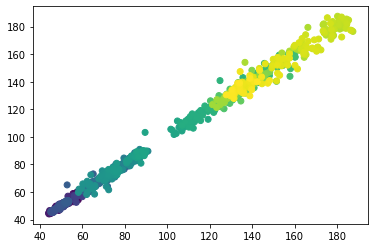

In [505]:
test.graph(test.ticker_embedding)

In [506]:
test.ticker_tset
test.tembedding3d(test.ticker_tset)
test.ticker_embedding3d
test.graph3d(test.ticker_embedding3d)

## Llamamos al histórico de la acción

In [279]:
df = yf.download('AAPL')['Adj Close']
df

[*********************100%***********************]  1 of 1 completed


Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.350006
2022-06-23    138.270004
Name: Adj Close, Length: 10471, dtype: float64

In [280]:
fig = px.line(df)
fig.show()

## Aplicamos densidad espectral

array([5.69616283e+04, 2.99556101e+04, 1.78528522e+02, 7.70586275e+01,
       4.02698271e+01, 1.26061782e+01, 7.82766329e+00, 4.93214596e+00,
       1.59027481e+00, 3.64917972e+00, 5.91442761e+00, 1.12467070e+00,
       1.09970146e+00, 1.20864223e+00, 1.55987768e+00, 3.58725142e+00,
       2.38109498e+00, 1.11675921e+00, 1.38383034e+00, 9.58964408e-01,
       8.14238732e-01, 1.08506405e+00, 1.22988637e+00, 7.45715216e-01,
       3.92489110e-01, 6.08215138e-01, 2.92413898e-01, 2.22158675e-01,
       1.01950053e+00, 2.08197787e+00, 1.56372479e+00, 8.74417104e-01,
       5.55275835e-01, 3.65847160e-01, 2.41894069e-01, 1.75453562e-01,
       5.55574366e-02, 9.42050886e-02, 1.10434382e-01, 2.75546813e-01,
       2.14199262e-01, 1.53486697e-01, 1.35089180e-01, 3.92026820e-01,
       3.33091367e-01, 2.34056182e-01, 3.40073824e-01, 2.28805876e-01,
       8.80938859e-02, 1.85330733e-01, 1.04173929e-01, 4.90432515e-02,
       1.29870791e-01, 1.61614271e-01, 8.46989999e-02, 3.18795546e-01,
      

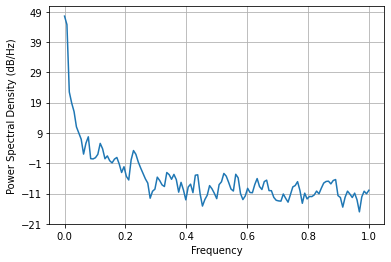

In [281]:
plt.psd(df)[0]

## Buscamos picos de manera "artesanal" xd

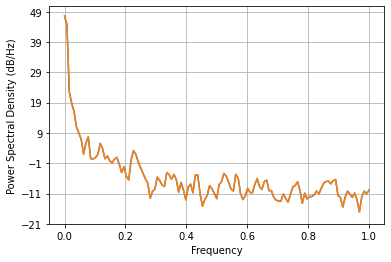

In [282]:
x_s = plt.psd(df)[1]
y_s = plt.psd(df)[0]

In [283]:
newy_s = y_s[(0.2<x_s)&(x_s<0.4)]

In [284]:
newx_s = x_s[(0.2<x_s)&(x_s<0.4)]


## Buscamos el valor x asociado al pico que hayamos escogido

In [285]:
matrix = []
for _ in range(newx_s.shape[0]):
    c = (newx_s[_], newy_s[_])
    matrix.append(c)
pd.DataFrame(matrix)   


,0,1
0,0.203125,0.292414
1,0.210938,0.222159
2,0.218750,1.019501
3,0.226562,2.081978
4,0.234375,1.563725
5,0.242188,0.874417
6,0.250000,0.555276
7,0.257812,0.365847
8,0.265625,0.241894
9,0.273438,0.175454


In [286]:
np.array(matrix[1:][1]).max()

1.0195005254186182

## Ventana de tiempo óptima para AAPL

In [287]:
1/0.226562

4.413802844254553

In [288]:
aapl = np.array(df)
(aapl.shape[0]/4)//1

2617.0

In [289]:
aapl_tset = []
for tao in (range(int(aapl.shape[0]/4)//1)):
    a = aapl[(4*tao)]
    aapl_tset.append(a)
aapl_tset
    

[0.10017844289541245,
 0.0927744060754776,
 0.11324518173933029,
 0.1189078614115715,
 0.10758330672979355,
 0.10627664625644684,
 0.11455179005861282,
 0.11411622911691666,
 0.10409898310899734,
 0.09974293410778046,
 0.09495208412408829,
 0.09103153645992279,
 0.08580511808395386,
 0.09233884513378143,
 0.09016045182943344,
 0.07535161823034286,
 0.08449855446815491,
 0.09320996701717377,
 0.08624066412448883,
 0.09190334379673004,
 0.09408101439476013,
 0.0971297174692154,
 0.09582313895225525,
 0.10017844289541245,
 0.0988718718290329,
 0.09669417887926102,
 0.09495208412408829,
 0.09582313895225525,
 0.1088898554444313,
 0.11542282998561859,
 0.11019647121429443,
 0.11455179005861282,
 0.1088898554444313,
 0.1032271757721901,
 0.09800078719854355,
 0.08667617291212082,
 0.07752928882837296,
 0.08711174130439758,
 0.07883583754301071,
 0.08406303077936172,
 0.08624066412448883,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054105043411,
 0.06751205027103424,
 0.07012522965669

In [290]:
max(aapl_tset)

181.51170349121094

In [291]:
aapl_embedding = []
for i in range(len(aapl_tset)-1):
    point = (aapl_tset[i], aapl_tset[i+1])
    aapl_embedding.append(point)
aapl_embedding    

[(0.10017844289541245, 0.0927744060754776),
 (0.0927744060754776, 0.11324518173933029),
 (0.11324518173933029, 0.1189078614115715),
 (0.1189078614115715, 0.10758330672979355),
 (0.10758330672979355, 0.10627664625644684),
 (0.10627664625644684, 0.11455179005861282),
 (0.11455179005861282, 0.11411622911691666),
 (0.11411622911691666, 0.10409898310899734),
 (0.10409898310899734, 0.09974293410778046),
 (0.09974293410778046, 0.09495208412408829),
 (0.09495208412408829, 0.09103153645992279),
 (0.09103153645992279, 0.08580511808395386),
 (0.08580511808395386, 0.09233884513378143),
 (0.09233884513378143, 0.09016045182943344),
 (0.09016045182943344, 0.07535161823034286),
 (0.07535161823034286, 0.08449855446815491),
 (0.08449855446815491, 0.09320996701717377),
 (0.09320996701717377, 0.08624066412448883),
 (0.08624066412448883, 0.09190334379673004),
 (0.09190334379673004, 0.09408101439476013),
 (0.09408101439476013, 0.0971297174692154),
 (0.0971297174692154, 0.09582313895225525),
 (0.095823138952

In [292]:
X = []
for i in range(len(aapl_embedding)):
    x_ate = aapl_embedding[i][0]
    X.append(x_ate)
X    

[0.10017844289541245,
 0.0927744060754776,
 0.11324518173933029,
 0.1189078614115715,
 0.10758330672979355,
 0.10627664625644684,
 0.11455179005861282,
 0.11411622911691666,
 0.10409898310899734,
 0.09974293410778046,
 0.09495208412408829,
 0.09103153645992279,
 0.08580511808395386,
 0.09233884513378143,
 0.09016045182943344,
 0.07535161823034286,
 0.08449855446815491,
 0.09320996701717377,
 0.08624066412448883,
 0.09190334379673004,
 0.09408101439476013,
 0.0971297174692154,
 0.09582313895225525,
 0.10017844289541245,
 0.0988718718290329,
 0.09669417887926102,
 0.09495208412408829,
 0.09582313895225525,
 0.1088898554444313,
 0.11542282998561859,
 0.11019647121429443,
 0.11455179005861282,
 0.1088898554444313,
 0.1032271757721901,
 0.09800078719854355,
 0.08667617291212082,
 0.07752928882837296,
 0.08711174130439758,
 0.07883583754301071,
 0.08406303077936172,
 0.08624066412448883,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054105043411,
 0.06751205027103424,
 0.07012522965669

In [293]:
Y = []
for i in range(len(aapl_embedding)):
    y_ate = aapl_embedding[i][1]
    Y.append(y_ate)
Y    

[0.0927744060754776,
 0.11324518173933029,
 0.1189078614115715,
 0.10758330672979355,
 0.10627664625644684,
 0.11455179005861282,
 0.11411622911691666,
 0.10409898310899734,
 0.09974293410778046,
 0.09495208412408829,
 0.09103153645992279,
 0.08580511808395386,
 0.09233884513378143,
 0.09016045182943344,
 0.07535161823034286,
 0.08449855446815491,
 0.09320996701717377,
 0.08624066412448883,
 0.09190334379673004,
 0.09408101439476013,
 0.0971297174692154,
 0.09582313895225525,
 0.10017844289541245,
 0.0988718718290329,
 0.09669417887926102,
 0.09495208412408829,
 0.09582313895225525,
 0.1088898554444313,
 0.11542282998561859,
 0.11019647121429443,
 0.11455179005861282,
 0.1088898554444313,
 0.1032271757721901,
 0.09800078719854355,
 0.08667617291212082,
 0.07752928882837296,
 0.08711174130439758,
 0.07883583754301071,
 0.08406303077936172,
 0.08624066412448883,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054105043411,
 0.06751205027103424,
 0.07012522965669632,
 0.07099629938602

## Topological embedding AAPL

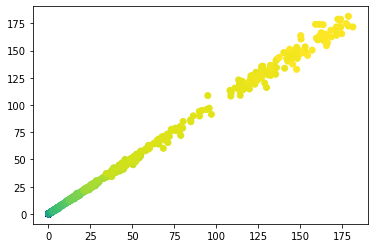

In [294]:
color = np.linspace(0,1, num=len(X))
plt.scatter(X,Y, c = color)
plt.show()

In [295]:
px.scatter(x = X,y = Y)


## AAPL a 16 días

In [296]:
df

Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.350006
2022-06-23    138.270004
Name: Adj Close, Length: 10471, dtype: float64

In [297]:
aapl16_tset = []
for tao in (range(int(aapl.shape[0]/16)//1)):
    a = aapl[(16*tao)]
    aapl16_tset.append(a)
aapl16_tset
       

[0.10017844289541245,
 0.10758330672979355,
 0.10409898310899734,
 0.08580511808395386,
 0.08449855446815491,
 0.09408101439476013,
 0.0988718718290329,
 0.1088898554444313,
 0.1088898554444313,
 0.07752928882837296,
 0.08624066412448883,
 0.06751205027103424,
 0.06141381710767746,
 0.06489808857440948,
 0.06968968361616135,
 0.0627204179763794,
 0.07360944896936417,
 0.0627204179763794,
 0.0705607682466507,
 0.06359148770570755,
 0.062284860759973526,
 0.05618744343519211,
 0.055751901119947433,
 0.04878263175487518,
 0.046604983508586884,
 0.04442732781171799,
 0.04268520697951317,
 0.059671688824892044,
 0.06533358991146088,
 0.08232089877128601,
 0.1049700677394867,
 0.11106749624013901,
 0.10845436155796051,
 0.11498729139566422,
 0.14721889793872833,
 0.1628989279270172,
 0.15026767551898956,
 0.1637698858976364,
 0.1907752901315689,
 0.2038419246673584,
 0.18554799258708954,
 0.15244610607624054,
 0.11934337764978409,
 0.12674738466739655,
 0.08667617291212082,
 0.06751205027103

In [298]:
aapl16_embedding = []
for i in range(len(aapl16_tset)-1):
    point = (aapl16_tset[i], aapl16_tset[i+1])
    aapl16_embedding.append(point)
aapl16_embedding   

[(0.10017844289541245, 0.10758330672979355),
 (0.10758330672979355, 0.10409898310899734),
 (0.10409898310899734, 0.08580511808395386),
 (0.08580511808395386, 0.08449855446815491),
 (0.08449855446815491, 0.09408101439476013),
 (0.09408101439476013, 0.0988718718290329),
 (0.0988718718290329, 0.1088898554444313),
 (0.1088898554444313, 0.1088898554444313),
 (0.1088898554444313, 0.07752928882837296),
 (0.07752928882837296, 0.08624066412448883),
 (0.08624066412448883, 0.06751205027103424),
 (0.06751205027103424, 0.06141381710767746),
 (0.06141381710767746, 0.06489808857440948),
 (0.06489808857440948, 0.06968968361616135),
 (0.06968968361616135, 0.0627204179763794),
 (0.0627204179763794, 0.07360944896936417),
 (0.07360944896936417, 0.0627204179763794),
 (0.0627204179763794, 0.0705607682466507),
 (0.0705607682466507, 0.06359148770570755),
 (0.06359148770570755, 0.062284860759973526),
 (0.062284860759973526, 0.05618744343519211),
 (0.05618744343519211, 0.055751901119947433),
 (0.055751901119947

In [299]:
X16 = []
for i in range(len(aapl16_embedding)):
    x_ate = aapl16_embedding[i][0]
    X16.append(x_ate)
X16    

[0.10017844289541245,
 0.10758330672979355,
 0.10409898310899734,
 0.08580511808395386,
 0.08449855446815491,
 0.09408101439476013,
 0.0988718718290329,
 0.1088898554444313,
 0.1088898554444313,
 0.07752928882837296,
 0.08624066412448883,
 0.06751205027103424,
 0.06141381710767746,
 0.06489808857440948,
 0.06968968361616135,
 0.0627204179763794,
 0.07360944896936417,
 0.0627204179763794,
 0.0705607682466507,
 0.06359148770570755,
 0.062284860759973526,
 0.05618744343519211,
 0.055751901119947433,
 0.04878263175487518,
 0.046604983508586884,
 0.04442732781171799,
 0.04268520697951317,
 0.059671688824892044,
 0.06533358991146088,
 0.08232089877128601,
 0.1049700677394867,
 0.11106749624013901,
 0.10845436155796051,
 0.11498729139566422,
 0.14721889793872833,
 0.1628989279270172,
 0.15026767551898956,
 0.1637698858976364,
 0.1907752901315689,
 0.2038419246673584,
 0.18554799258708954,
 0.15244610607624054,
 0.11934337764978409,
 0.12674738466739655,
 0.08667617291212082,
 0.06751205027103

In [300]:
Y16 = []
for i in range(len(aapl16_embedding)):
    y_ate = aapl16_embedding[i][1]
    Y16.append(y_ate)
Y16  

[0.10758330672979355,
 0.10409898310899734,
 0.08580511808395386,
 0.08449855446815491,
 0.09408101439476013,
 0.0988718718290329,
 0.1088898554444313,
 0.1088898554444313,
 0.07752928882837296,
 0.08624066412448883,
 0.06751205027103424,
 0.06141381710767746,
 0.06489808857440948,
 0.06968968361616135,
 0.0627204179763794,
 0.07360944896936417,
 0.0627204179763794,
 0.0705607682466507,
 0.06359148770570755,
 0.062284860759973526,
 0.05618744343519211,
 0.055751901119947433,
 0.04878263175487518,
 0.046604983508586884,
 0.04442732781171799,
 0.04268520697951317,
 0.059671688824892044,
 0.06533358991146088,
 0.08232089877128601,
 0.1049700677394867,
 0.11106749624013901,
 0.10845436155796051,
 0.11498729139566422,
 0.14721889793872833,
 0.1628989279270172,
 0.15026767551898956,
 0.1637698858976364,
 0.1907752901315689,
 0.2038419246673584,
 0.18554799258708954,
 0.15244610607624054,
 0.11934337764978409,
 0.12674738466739655,
 0.08667617291212082,
 0.06751205027103424,
 0.06707648187875

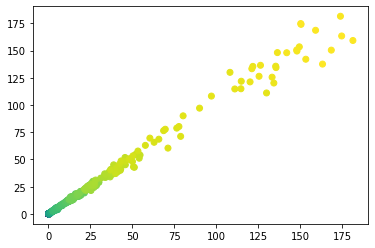

In [301]:
color = np.linspace(0,1, num=len(X16))
plt.scatter(X16,Y16, c = color)
plt.show()

## AAPL embedding en 3 dimensiones

In [302]:
apple = yf.download('AAPL')['Adj Close']
apple

[*********************100%***********************]  1 of 1 completed


Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.350006
2022-06-23    138.270004
Name: Adj Close, Length: 10471, dtype: float64

In [303]:
apple_tset = []
for tao in (range(int(apple.shape[0]/4)//1)):
    a = apple[(4*tao)]
    apple_tset.append(a)
apple_tset

[0.10017844289541245,
 0.09277442842721939,
 0.1132451593875885,
 0.1189078763127327,
 0.10758328437805176,
 0.10627665370702744,
 0.11455177515745163,
 0.11411618441343307,
 0.10409901291131973,
 0.09974294155836105,
 0.09495209157466888,
 0.0910315290093422,
 0.08580513298511505,
 0.09233888238668442,
 0.09016042947769165,
 0.07535164058208466,
 0.08449854701757431,
 0.09320991486310959,
 0.08624067902565002,
 0.09190335124731064,
 0.09408102929592133,
 0.0971297100186348,
 0.09582311660051346,
 0.10017844289541245,
 0.0988718569278717,
 0.0966942086815834,
 0.09495209157466888,
 0.09582311660051346,
 0.1088898777961731,
 0.11542285233736038,
 0.11019644886255264,
 0.11455177515745163,
 0.1088898777961731,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752926647663116,
 0.08711172640323639,
 0.0788358673453331,
 0.08406299352645874,
 0.08624067902565002,
 0.08798278123140335,
 0.08101429790258408,
 0.0744805559515953,
 0.06751205027103424,
 0.07012525945901871,

In [304]:
apple_embedding = []
for i in range(len(apple_tset)-1):
    point = (apple_tset[i], apple_tset[i+1], i)
    apple_embedding.append(point)
apple_embedding   

[(0.10017844289541245, 0.09277442842721939, 0),
 (0.09277442842721939, 0.1132451593875885, 1),
 (0.1132451593875885, 0.1189078763127327, 2),
 (0.1189078763127327, 0.10758328437805176, 3),
 (0.10758328437805176, 0.10627665370702744, 4),
 (0.10627665370702744, 0.11455177515745163, 5),
 (0.11455177515745163, 0.11411618441343307, 6),
 (0.11411618441343307, 0.10409901291131973, 7),
 (0.10409901291131973, 0.09974294155836105, 8),
 (0.09974294155836105, 0.09495209157466888, 9),
 (0.09495209157466888, 0.0910315290093422, 10),
 (0.0910315290093422, 0.08580513298511505, 11),
 (0.08580513298511505, 0.09233888238668442, 12),
 (0.09233888238668442, 0.09016042947769165, 13),
 (0.09016042947769165, 0.07535164058208466, 14),
 (0.07535164058208466, 0.08449854701757431, 15),
 (0.08449854701757431, 0.09320991486310959, 16),
 (0.09320991486310959, 0.08624067902565002, 17),
 (0.08624067902565002, 0.09190335124731064, 18),
 (0.09190335124731064, 0.09408102929592133, 19),
 (0.09408102929592133, 0.09712971001

In [305]:
X3d = []
for i in range(len(apple_embedding)):
    x_ate = apple_embedding[i][0]
    X3d.append(x_ate)
X3d    

[0.10017844289541245,
 0.09277442842721939,
 0.1132451593875885,
 0.1189078763127327,
 0.10758328437805176,
 0.10627665370702744,
 0.11455177515745163,
 0.11411618441343307,
 0.10409901291131973,
 0.09974294155836105,
 0.09495209157466888,
 0.0910315290093422,
 0.08580513298511505,
 0.09233888238668442,
 0.09016042947769165,
 0.07535164058208466,
 0.08449854701757431,
 0.09320991486310959,
 0.08624067902565002,
 0.09190335124731064,
 0.09408102929592133,
 0.0971297100186348,
 0.09582311660051346,
 0.10017844289541245,
 0.0988718569278717,
 0.0966942086815834,
 0.09495209157466888,
 0.09582311660051346,
 0.1088898777961731,
 0.11542285233736038,
 0.11019644886255264,
 0.11455177515745163,
 0.1088898777961731,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752926647663116,
 0.08711172640323639,
 0.0788358673453331,
 0.08406299352645874,
 0.08624067902565002,
 0.08798278123140335,
 0.08101429790258408,
 0.0744805559515953,
 0.06751205027103424,
 0.07012525945901871,

In [306]:
Y3d = []
for i in range(len(apple_embedding)):
    y_ate = apple_embedding[i][1]
    Y3d.append(y_ate)
Y3d    

[0.09277442842721939,
 0.1132451593875885,
 0.1189078763127327,
 0.10758328437805176,
 0.10627665370702744,
 0.11455177515745163,
 0.11411618441343307,
 0.10409901291131973,
 0.09974294155836105,
 0.09495209157466888,
 0.0910315290093422,
 0.08580513298511505,
 0.09233888238668442,
 0.09016042947769165,
 0.07535164058208466,
 0.08449854701757431,
 0.09320991486310959,
 0.08624067902565002,
 0.09190335124731064,
 0.09408102929592133,
 0.0971297100186348,
 0.09582311660051346,
 0.10017844289541245,
 0.0988718569278717,
 0.0966942086815834,
 0.09495209157466888,
 0.09582311660051346,
 0.1088898777961731,
 0.11542285233736038,
 0.11019644886255264,
 0.11455177515745163,
 0.1088898777961731,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752926647663116,
 0.08711172640323639,
 0.0788358673453331,
 0.08406299352645874,
 0.08624067902565002,
 0.08798278123140335,
 0.08101429790258408,
 0.0744805559515953,
 0.06751205027103424,
 0.07012525945901871,
 0.07099626958370209,

In [307]:
Z3d = []
for i in range(len(apple_embedding)):
    z_ate = apple_embedding[i][2]
    Z3d.append(z_ate)
Z3d    

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [308]:
pdaapl = pd.DataFrame()
pdaapl['x'] = X3d
pdaapl['y'] = Y3d
pdaapl['z'] = Z3d
pdaapl

,x,y,z
0,0.100178,0.092774,0
1,0.092774,0.113245,1
2,0.113245,0.118908,2
3,0.118908,0.107583,3
4,0.107583,0.106277,4
...,...,...,...
2611,145.539993,137.589996,2611
2612,137.589996,143.779999,2612
2613,143.779999,151.210007,2613
2614,151.210007,147.960007,2614


In [309]:
fig = px.scatter_3d(pdaapl, x='x', y='y', z='z', color = pdaapl['z'])

In [310]:
fig.show()

## Hausdorff in 3D test

In [311]:
apple_embedding

[(0.10017844289541245, 0.09277442842721939, 0),
 (0.09277442842721939, 0.1132451593875885, 1),
 (0.1132451593875885, 0.1189078763127327, 2),
 (0.1189078763127327, 0.10758328437805176, 3),
 (0.10758328437805176, 0.10627665370702744, 4),
 (0.10627665370702744, 0.11455177515745163, 5),
 (0.11455177515745163, 0.11411618441343307, 6),
 (0.11411618441343307, 0.10409901291131973, 7),
 (0.10409901291131973, 0.09974294155836105, 8),
 (0.09974294155836105, 0.09495209157466888, 9),
 (0.09495209157466888, 0.0910315290093422, 10),
 (0.0910315290093422, 0.08580513298511505, 11),
 (0.08580513298511505, 0.09233888238668442, 12),
 (0.09233888238668442, 0.09016042947769165, 13),
 (0.09016042947769165, 0.07535164058208466, 14),
 (0.07535164058208466, 0.08449854701757431, 15),
 (0.08449854701757431, 0.09320991486310959, 16),
 (0.09320991486310959, 0.08624067902565002, 17),
 (0.08624067902565002, 0.09190335124731064, 18),
 (0.09190335124731064, 0.09408102929592133, 19),
 (0.09408102929592133, 0.09712971001

In [312]:
eurusd3d_embedding

[(1.19650137424469, 1.2088974714279175, 0),
 (1.2088974714279175, 1.2122975587844849, 1),
 (1.2122975587844849, 1.2080942392349243, 2),
 (1.2080942392349243, 1.2186946868896484, 3),
 (1.2186946868896484, 1.2220009565353394, 4),
 (1.2220009565353394, 1.2249947786331177, 5),
 (1.2249947786331177, 1.2190959453582764, 6),
 (1.2190959453582764, 1.2224042415618896, 7),
 (1.2224042415618896, 1.2278977632522583, 8),
 (1.2278977632522583, 1.2319974899291992, 9),
 (1.2319974899291992, 1.2321947813034058, 10),
 (1.2321947813034058, 1.2402024269104004, 11),
 (1.2402024269104004, 1.2422977685928345, 12),
 (1.2422977685928345, 1.2384973764419556, 13),
 (1.2384973764419556, 1.2398948669433594, 14),
 (1.2398948669433594, 1.2400025129318237, 15),
 (1.2400025129318237, 1.245298981666565, 16),
 (1.245298981666565, 1.2448029518127441, 17),
 (1.2448029518127441, 1.243193507194519, 18),
 (1.243193507194519, 1.2483927011489868, 19),
 (1.2483927011489868, 1.2548940181732178, 20),
 (1.2548940181732178, 1.25900

In [313]:
directed_hausdorff(np.array(apple_embedding), np.array(eurusd3d_embedding))[0]

252.85166925067878

## Prueba con BABA

In [314]:
baba = yf.download('BABA')['Adj Close']
baba

[*********************100%***********************]  1 of 1 completed


Date
2014-09-19     93.889999
2014-09-22     89.889999
2014-09-23     87.169998
2014-09-24     90.570000
2014-09-25     88.919998
                 ...    
2022-06-16    101.449997
2022-06-17    102.239998
2022-06-21    106.389999
2022-06-22    105.150002
2022-06-23    112.110001
Name: Adj Close, Length: 1954, dtype: float64

In [315]:
px.line(baba)

In [316]:
#numpy_array = np.array(plt.psd(baba))
#px.scatter(x = numpy_array[1], y = numpy_array[0])
# import plotly.graph_objs as go
# fig = go.Figure(data=go.Scatter(x=numpy_array[1], y=numpy_array[0], mode='lines'),
#                 layout_xaxis_range=[0,-0.2])

(array([2.28194390e+06, 1.14128046e+06, 4.35697997e+03, 1.68971366e+03,
        6.68315388e+02, 1.08538150e+03, 6.08583946e+02, 2.69350027e+02,
        3.39638713e+02, 7.46922022e+01, 8.60162375e+01, 1.04778715e+02,
        6.05728129e+01, 1.21406703e+02, 2.00083202e+02, 2.26752072e+02,
        7.70668425e+01, 7.70966362e+01, 6.98521727e+01, 7.93650339e+01,
        3.90489956e+01, 5.87231962e+01, 3.80764070e+01, 3.73506683e+01,
        3.62417345e+01, 2.26165502e+01, 1.24138339e+01, 1.55473347e+01,
        1.82779018e+01, 2.72513732e+01, 4.13366534e+01, 4.29781358e+01,
        2.48590474e+01, 2.21826110e+01, 1.81984608e+01, 2.09754195e+01,
        1.74338850e+01, 1.81058192e+01, 1.28151680e+01, 3.03247789e+00,
        4.07041819e+00, 1.46118149e+01, 2.78163478e+01, 7.84009113e+00,
        9.73201764e+00, 4.83349521e+00, 5.58874914e+00, 7.14296815e+00,
        7.01550173e+00, 5.89842732e+00, 3.79320557e+00, 2.81597144e+00,
        1.03652391e+01, 1.61107440e+01, 8.60627194e+00, 9.310365

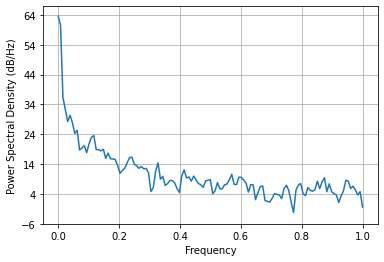

In [317]:
plt.psd(baba)

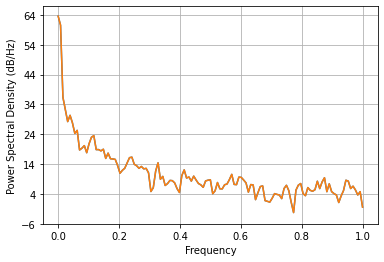

In [318]:
babax_s = plt.psd(baba)[1]
babay_s = plt.psd(baba)[0]

In [319]:
newbabay_s = babay_s[(0.1<babax_s)&(babax_s<0.25)]
newbabax_s = babax_s[(0.1<babax_s)&(babax_s<0.25)]


In [320]:
babamatrix = []
for _ in range(newbabax_s.shape[0]):
    c = (newbabax_s[_], newbabay_s[_])
    babamatrix.append(c)
pd.DataFrame(babamatrix)   


,0,1
0,0.101562,121.406703
1,0.109375,200.083202
2,0.117188,226.752072
3,0.125000,77.066842
4,0.132812,77.096636
5,0.140625,69.852173
6,0.148438,79.365034
7,0.156250,39.048996
8,0.164062,58.723196
9,0.171875,38.076407


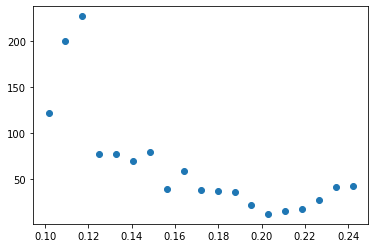

In [321]:
plt.scatter(newbabax_s, newbabay_s)

## Lagtime ideal para BABA

In [322]:
1/0.117188

8.533296924599789

In [323]:
baba_tset = []
for tao in (range(int(baba.shape[0]/8)//1)):
    a = baba[(8*tao)]
    baba_tset.append(a)
len(baba_tset)

244

In [324]:
baba_embedding = []
for i in range(len(baba_tset)-1):
    point = (baba_tset[i], baba_tset[i+1])
    baba_embedding.append(point)
baba_embedding    

[(93.88999938964844, 86.0999984741211),
 (86.0999984741211, 85.12000274658203),
 (85.12000274658203, 94.44999694824219),
 (94.44999694824219, 106.06999969482422),
 (106.06999969482422, 115.0999984741211),
 (115.0999984741211, 112.66999816894531),
 (112.66999816894531, 107.4800033569336),
 (107.4800033569336, 110.6500015258789),
 (110.6500015258789, 103.5999984741211),
 (103.5999984741211, 99.58000183105469),
 (99.58000183105469, 102.94000244140625),
 (102.94000244140625, 85.68000030517578),
 (85.68000030517578, 86.88999938964844),
 (86.88999938964844, 81.58000183105469),
 (81.58000183105469, 81.86000061035156),
 (81.86000061035156, 83.75),
 (83.75, 82.20999908447266),
 (82.20999908447266, 81.9000015258789),
 (81.9000015258789, 82.44999694824219),
 (82.44999694824219, 86.72000122070312),
 (86.72000122070312, 93.87999725341797),
 (93.87999725341797, 90.79000091552734),
 (90.79000091552734, 86.12000274658203),
 (86.12000274658203, 85.23999786376953),
 (85.23999786376953, 77.94000244140625

In [325]:
Xbaba = []
for i in range(len(baba_embedding)):
    x_bte = baba_embedding[i][0]
    Xbaba.append(x_bte)
Xbaba   

[93.88999938964844,
 86.0999984741211,
 85.12000274658203,
 94.44999694824219,
 106.06999969482422,
 115.0999984741211,
 112.66999816894531,
 107.4800033569336,
 110.6500015258789,
 103.5999984741211,
 99.58000183105469,
 102.94000244140625,
 85.68000030517578,
 86.88999938964844,
 81.58000183105469,
 81.86000061035156,
 83.75,
 82.20999908447266,
 81.9000015258789,
 82.44999694824219,
 86.72000122070312,
 93.87999725341797,
 90.79000091552734,
 86.12000274658203,
 85.23999786376953,
 77.94000244140625,
 82.66999816894531,
 79.95999908447266,
 77.33999633789062,
 68.18000030517578,
 65.54000091552734,
 64.8499984741211,
 59.2400016784668,
 66.27999877929688,
 72.6500015258789,
 82.22000122070312,
 81.43000030517578,
 79.94999694824219,
 82.58999633789062,
 82.48999786376953,
 82.13999938964844,
 70.80000305175781,
 70.72000122070312,
 65.08999633789062,
 60.88999938964844,
 66.66000366210938,
 71.06999969482422,
 76.25,
 79.02999877929688,
 77.86000061035156,
 79.88999938964844,
 75.81

In [326]:
Ybaba = []
for i in range(len(baba_embedding)):
    y_bte = baba_embedding[i][1]
    Ybaba.append(y_bte)
Ybaba    

[86.0999984741211,
 85.12000274658203,
 94.44999694824219,
 106.06999969482422,
 115.0999984741211,
 112.66999816894531,
 107.4800033569336,
 110.6500015258789,
 103.5999984741211,
 99.58000183105469,
 102.94000244140625,
 85.68000030517578,
 86.88999938964844,
 81.58000183105469,
 81.86000061035156,
 83.75,
 82.20999908447266,
 81.9000015258789,
 82.44999694824219,
 86.72000122070312,
 93.87999725341797,
 90.79000091552734,
 86.12000274658203,
 85.23999786376953,
 77.94000244140625,
 82.66999816894531,
 79.95999908447266,
 77.33999633789062,
 68.18000030517578,
 65.54000091552734,
 64.8499984741211,
 59.2400016784668,
 66.27999877929688,
 72.6500015258789,
 82.22000122070312,
 81.43000030517578,
 79.94999694824219,
 82.58999633789062,
 82.48999786376953,
 82.13999938964844,
 70.80000305175781,
 70.72000122070312,
 65.08999633789062,
 60.88999938964844,
 66.66000366210938,
 71.06999969482422,
 76.25,
 79.02999877929688,
 77.86000061035156,
 79.88999938964844,
 75.81999969482422,
 79.29

## Topological embedding BABA

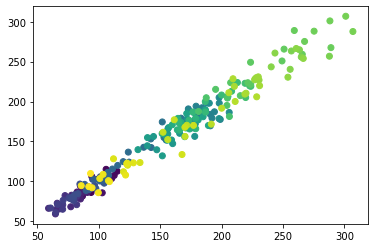

In [327]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xbaba))
plt.scatter(x = Xbaba,y = Ybaba, c = color)
plt.show()


## Target

In [328]:
tgt = yf.download('TGT')['Adj Close']
tgt

[*********************100%***********************]  1 of 1 completed


Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187415
                 ...    
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    144.699997
2022-06-22    140.809998
2022-06-23    146.809998
Name: Adj Close, Length: 12445, dtype: float64

In [329]:
fig = px.line(df)
fig.show()

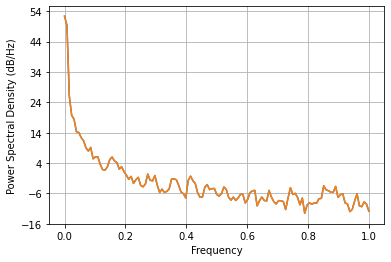

In [330]:
tgtx_s = plt.psd(tgt)[1]
tgty_s = plt.psd(tgt)[0]

In [331]:
tgtmatrix = []
for _ in range(tgtx_s.shape[0]):
    c = (tgtx_s[_], tgty_s[_])
    tgtmatrix.append(c)
pd.DataFrame(tgtmatrix).head(50)   

,0,1
0,0.000000,172846.067385
1,0.007812,86648.846381
2,0.015625,410.202747
3,0.023438,93.630429
4,0.031250,69.655512
5,0.039062,27.249755
6,0.046875,25.374825
7,0.054688,17.384962
8,0.062500,13.690352
9,0.070312,8.027678


In [332]:
newtgty_s = tgty_s[(0.1<tgtx_s)&(tgtx_s<0.2)]
newtgtx_s = tgtx_s[(0.1<tgtx_s)&(tgtx_s<0.2)]

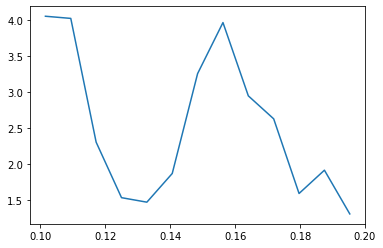

In [333]:
plt.plot(newtgtx_s, newtgty_s)

## Ventana de tiempo óptima para TGT

In [334]:
1/0.156250

6.4

## Topological embedding

In [335]:
tgt

Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187415
                 ...    
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    144.699997
2022-06-22    140.809998
2022-06-23    146.809998
Name: Adj Close, Length: 12445, dtype: float64

In [336]:
tgt.tail(10)

Date
2022-06-09    154.550003
2022-06-10    149.669998
2022-06-13    144.809998
2022-06-14    142.699997
2022-06-15    147.440002
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    144.699997
2022-06-22    140.809998
2022-06-23    146.809998
Name: Adj Close, dtype: float64

In [337]:
figtgt = px.line(tgt)
figtgt.show()

In [338]:
tgt_tset = []
for tao in (range(int(tgt.shape[0]/6)//1)):
    a = tgt[(6*tao)]
    tgt_tset.append(a)
tgt_tset

[0.2049073576927185,
 0.19366265833377838,
 0.18866482377052307,
 0.18741540610790253,
 0.17742010951042175,
 0.17242221534252167,
 0.19366265833377838,
 0.17617078125476837,
 0.17367152869701385,
 0.17742010951042175,
 0.17117273807525635,
 0.17742010951042175,
 0.16742436587810516,
 0.17991870641708374,
 0.16492561995983124,
 0.16367627680301666,
 0.16242681443691254,
 0.15493030846118927,
 0.14243577420711517,
 0.1374378502368927,
 0.13993707299232483,
 0.1286918967962265,
 0.12619313597679138,
 0.13119103014469147,
 0.13493911921977997,
 0.13618843257427216,
 0.14493447542190552,
 0.1461842656135559,
 0.1211952343583107,
 0.1174471527338028,
 0.11494795978069305,
 0.11369868367910385,
 0.10745135694742203,
 0.08995935320854187,
 0.09120870381593704,
 0.08995935320854187,
 0.08995935320854187,
 0.0999547690153122,
 0.0999547690153122,
 0.0962066650390625,
 0.10245393961668015,
 0.10120455920696259,
 0.09745601564645767,
 0.10245393961668015,
 0.1174471527338028,
 0.11119994521141052

In [339]:
tgt_embedding = []
for i in range(len(tgt_tset)-1):
    point = (tgt_tset[i], tgt_tset[i+1])
    tgt_embedding.append(point)
tgt_embedding    

[(0.2049073576927185, 0.19366265833377838),
 (0.19366265833377838, 0.18866482377052307),
 (0.18866482377052307, 0.18741540610790253),
 (0.18741540610790253, 0.17742010951042175),
 (0.17742010951042175, 0.17242221534252167),
 (0.17242221534252167, 0.19366265833377838),
 (0.19366265833377838, 0.17617078125476837),
 (0.17617078125476837, 0.17367152869701385),
 (0.17367152869701385, 0.17742010951042175),
 (0.17742010951042175, 0.17117273807525635),
 (0.17117273807525635, 0.17742010951042175),
 (0.17742010951042175, 0.16742436587810516),
 (0.16742436587810516, 0.17991870641708374),
 (0.17991870641708374, 0.16492561995983124),
 (0.16492561995983124, 0.16367627680301666),
 (0.16367627680301666, 0.16242681443691254),
 (0.16242681443691254, 0.15493030846118927),
 (0.15493030846118927, 0.14243577420711517),
 (0.14243577420711517, 0.1374378502368927),
 (0.1374378502368927, 0.13993707299232483),
 (0.13993707299232483, 0.1286918967962265),
 (0.1286918967962265, 0.12619313597679138),
 (0.12619313597

In [340]:
Xtgt = []
for i in range(len(tgt_embedding)):
    x_tte = tgt_embedding[i][0]
    Xtgt.append(x_tte)
Xtgt  

[0.2049073576927185,
 0.19366265833377838,
 0.18866482377052307,
 0.18741540610790253,
 0.17742010951042175,
 0.17242221534252167,
 0.19366265833377838,
 0.17617078125476837,
 0.17367152869701385,
 0.17742010951042175,
 0.17117273807525635,
 0.17742010951042175,
 0.16742436587810516,
 0.17991870641708374,
 0.16492561995983124,
 0.16367627680301666,
 0.16242681443691254,
 0.15493030846118927,
 0.14243577420711517,
 0.1374378502368927,
 0.13993707299232483,
 0.1286918967962265,
 0.12619313597679138,
 0.13119103014469147,
 0.13493911921977997,
 0.13618843257427216,
 0.14493447542190552,
 0.1461842656135559,
 0.1211952343583107,
 0.1174471527338028,
 0.11494795978069305,
 0.11369868367910385,
 0.10745135694742203,
 0.08995935320854187,
 0.09120870381593704,
 0.08995935320854187,
 0.08995935320854187,
 0.0999547690153122,
 0.0999547690153122,
 0.0962066650390625,
 0.10245393961668015,
 0.10120455920696259,
 0.09745601564645767,
 0.10245393961668015,
 0.1174471527338028,
 0.11119994521141052

In [341]:
Ytgt = []
for i in range(len(tgt_embedding)):
    y_tte = tgt_embedding[i][1]
    Ytgt.append(y_tte)
Ytgt    

[0.19366265833377838,
 0.18866482377052307,
 0.18741540610790253,
 0.17742010951042175,
 0.17242221534252167,
 0.19366265833377838,
 0.17617078125476837,
 0.17367152869701385,
 0.17742010951042175,
 0.17117273807525635,
 0.17742010951042175,
 0.16742436587810516,
 0.17991870641708374,
 0.16492561995983124,
 0.16367627680301666,
 0.16242681443691254,
 0.15493030846118927,
 0.14243577420711517,
 0.1374378502368927,
 0.13993707299232483,
 0.1286918967962265,
 0.12619313597679138,
 0.13119103014469147,
 0.13493911921977997,
 0.13618843257427216,
 0.14493447542190552,
 0.1461842656135559,
 0.1211952343583107,
 0.1174471527338028,
 0.11494795978069305,
 0.11369868367910385,
 0.10745135694742203,
 0.08995935320854187,
 0.09120870381593704,
 0.08995935320854187,
 0.08995935320854187,
 0.0999547690153122,
 0.0999547690153122,
 0.0962066650390625,
 0.10245393961668015,
 0.10120455920696259,
 0.09745601564645767,
 0.10245393961668015,
 0.1174471527338028,
 0.11119994521141052,
 0.1049526780843734

## Topoloigical embedding TGT

In [342]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xtgt))
px.scatter(x = Xtgt,y = Ytgt)



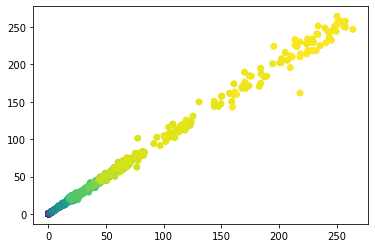

In [343]:
color = np.linspace(0,1, num=len(Xtgt))
plt.scatter(x = Xtgt,y = Ytgt, c = color)
plt.show()

## Target a 4 días de lag time

In [344]:
tgt = yf.download('TGT')['Adj Close']
tgt

[*********************100%***********************]  1 of 1 completed


Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187415
                 ...    
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    144.699997
2022-06-22    140.809998
2022-06-23    146.809998
Name: Adj Close, Length: 12445, dtype: float64

In [345]:
tgt4_tset = []
for tao in (range(int(tgt.shape[0]/4)//1)):
    a = tgt[(4*tao)]
    tgt4_tset.append(a)
tgt4_tset

[0.2049073874950409,
 0.1874154657125473,
 0.19116397202014923,
 0.1886647790670395,
 0.1874154657125473,
 0.18616600334644318,
 0.17742013931274414,
 0.16617488861083984,
 0.19241328537464142,
 0.19366270303726196,
 0.18616600334644318,
 0.1686740219593048,
 0.17367155849933624,
 0.17866937816143036,
 0.16742435097694397,
 0.17117276787757874,
 0.1686740219593048,
 0.17242220044136047,
 0.16742435097694397,
 0.1749209761619568,
 0.16992343962192535,
 0.16492556035518646,
 0.16492556035518646,
 0.16367629170417786,
 0.1624269038438797,
 0.15617965161800385,
 0.1586783081293106,
 0.1424357146024704,
 0.13993708789348602,
 0.1411864161491394,
 0.13993708789348602,
 0.13244037330150604,
 0.11619782447814941,
 0.1261931210756302,
 0.12369446456432343,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493447542190552,
 0.14493447542190552,
 0.1411864161491394,
 0.1299412101507187,
 0.12119518965482712,
 0.11869657039642334,
 0.11744708567857742,
 0.11494792997837067,
 0.11

In [346]:
tgt4_embedding = []
for i in range(len(tgt4_tset)-1):
    point = (tgt4_tset[i], tgt4_tset[i+1])
    tgt4_embedding.append(point)
tgt4_embedding   

[(0.2049073874950409, 0.1874154657125473),
 (0.1874154657125473, 0.19116397202014923),
 (0.19116397202014923, 0.1886647790670395),
 (0.1886647790670395, 0.1874154657125473),
 (0.1874154657125473, 0.18616600334644318),
 (0.18616600334644318, 0.17742013931274414),
 (0.17742013931274414, 0.16617488861083984),
 (0.16617488861083984, 0.19241328537464142),
 (0.19241328537464142, 0.19366270303726196),
 (0.19366270303726196, 0.18616600334644318),
 (0.18616600334644318, 0.1686740219593048),
 (0.1686740219593048, 0.17367155849933624),
 (0.17367155849933624, 0.17866937816143036),
 (0.17866937816143036, 0.16742435097694397),
 (0.16742435097694397, 0.17117276787757874),
 (0.17117276787757874, 0.1686740219593048),
 (0.1686740219593048, 0.17242220044136047),
 (0.17242220044136047, 0.16742435097694397),
 (0.16742435097694397, 0.1749209761619568),
 (0.1749209761619568, 0.16992343962192535),
 (0.16992343962192535, 0.16492556035518646),
 (0.16492556035518646, 0.16492556035518646),
 (0.16492556035518646, 

In [347]:
Xtgt4 = []
for i in range(len(tgt4_embedding)):
    x_tte = tgt4_embedding[i][0]
    Xtgt4.append(x_tte)
Xtgt4 

[0.2049073874950409,
 0.1874154657125473,
 0.19116397202014923,
 0.1886647790670395,
 0.1874154657125473,
 0.18616600334644318,
 0.17742013931274414,
 0.16617488861083984,
 0.19241328537464142,
 0.19366270303726196,
 0.18616600334644318,
 0.1686740219593048,
 0.17367155849933624,
 0.17866937816143036,
 0.16742435097694397,
 0.17117276787757874,
 0.1686740219593048,
 0.17242220044136047,
 0.16742435097694397,
 0.1749209761619568,
 0.16992343962192535,
 0.16492556035518646,
 0.16492556035518646,
 0.16367629170417786,
 0.1624269038438797,
 0.15617965161800385,
 0.1586783081293106,
 0.1424357146024704,
 0.13993708789348602,
 0.1411864161491394,
 0.13993708789348602,
 0.13244037330150604,
 0.11619782447814941,
 0.1261931210756302,
 0.12369446456432343,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493447542190552,
 0.14493447542190552,
 0.1411864161491394,
 0.1299412101507187,
 0.12119518965482712,
 0.11869657039642334,
 0.11744708567857742,
 0.11494792997837067,
 0.11

In [348]:
Ytgt4 = []
for i in range(len(tgt4_embedding)):
    y_tte = tgt4_embedding[i][1]
    Ytgt4.append(y_tte)
Ytgt4  

[0.1874154657125473,
 0.19116397202014923,
 0.1886647790670395,
 0.1874154657125473,
 0.18616600334644318,
 0.17742013931274414,
 0.16617488861083984,
 0.19241328537464142,
 0.19366270303726196,
 0.18616600334644318,
 0.1686740219593048,
 0.17367155849933624,
 0.17866937816143036,
 0.16742435097694397,
 0.17117276787757874,
 0.1686740219593048,
 0.17242220044136047,
 0.16742435097694397,
 0.1749209761619568,
 0.16992343962192535,
 0.16492556035518646,
 0.16492556035518646,
 0.16367629170417786,
 0.1624269038438797,
 0.15617965161800385,
 0.1586783081293106,
 0.1424357146024704,
 0.13993708789348602,
 0.1411864161491394,
 0.13993708789348602,
 0.13244037330150604,
 0.11619782447814941,
 0.1261931210756302,
 0.12369446456432343,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493447542190552,
 0.14493447542190552,
 0.1411864161491394,
 0.1299412101507187,
 0.12119518965482712,
 0.11869657039642334,
 0.11744708567857742,
 0.11494792997837067,
 0.11994586139917374,
 0.1

In [349]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xtgt4))
px.scatter(x = Xtgt4,y = Ytgt4)

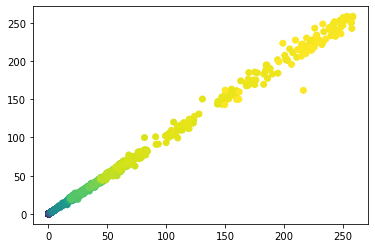

In [350]:
color = np.linspace(0,1, num=len(Xtgt4))
plt.scatter(x = Xtgt4,y = Ytgt4, c = color)
plt.show()

## Bitcoin

In [351]:
btc = yf.download('BTC-USD')['Adj Close']
btc

[*********************100%***********************]  1 of 1 completed


Date
2014-09-17      457.334015
2014-09-18      424.440002
2014-09-19      394.795990
2014-09-20      408.903992
2014-09-21      398.821014
                  ...     
2022-06-19    20553.271484
2022-06-20    20599.537109
2022-06-21    20710.597656
2022-06-22    19987.029297
2022-06-23    20737.408203
Name: Adj Close, Length: 2837, dtype: float64

<AxesSubplot:xlabel='Date'>

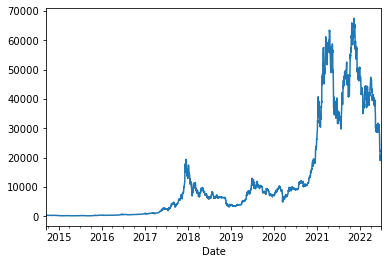

In [352]:
btc.plot()

(array([3.47712565e+10, 1.75387113e+10, 6.29480617e+08, 6.28443680e+07,
        2.08850484e+07, 3.73768350e+07, 3.42247744e+07, 1.44143938e+07,
        1.36452773e+07, 2.96553359e+07, 1.72281240e+07, 1.55210426e+07,
        8.67216792e+06, 7.79503509e+06, 3.01985917e+06, 5.95602904e+05,
        3.68963161e+06, 6.10950196e+06, 2.76783383e+06, 1.58365597e+06,
        3.10610837e+06, 1.32816747e+06, 2.43067770e+06, 2.82301367e+06,
        1.47616841e+06, 6.03313800e+05, 1.51795348e+06, 2.16042267e+06,
        1.17652592e+06, 7.82237035e+05, 2.10971717e+06, 2.90006368e+06,
        7.73251898e+05, 4.62050831e+05, 5.46024682e+05, 4.51254674e+05,
        1.02841407e+06, 4.49151589e+05, 2.38512679e+05, 2.41038393e+05,
        4.15997128e+05, 5.77090186e+05, 6.16557425e+05, 3.85325734e+05,
        3.62451533e+05, 2.90391878e+05, 2.95918739e+05, 5.74011422e+05,
        5.12055192e+05, 1.37491451e+05, 3.68079355e+05, 8.07304381e+05,
        1.21172567e+06, 6.79248531e+05, 4.73940575e+05, 4.120227

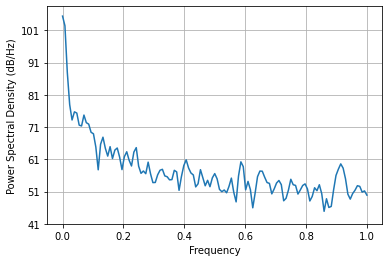

In [353]:
plt.psd(btc)

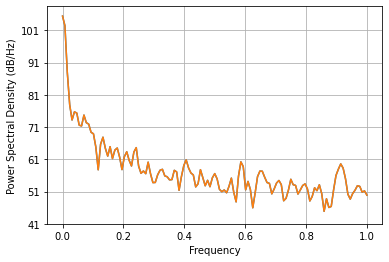

In [354]:
btcx_s = plt.psd(btc)[1]
btcy_s = plt.psd(btc)[0]

C:\Users\FELIZA~1\AppData\Local\Temp/ipykernel_2564/798815118.py:1: RuntimeWarning:

divide by zero encountered in log



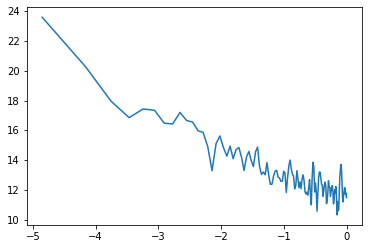

In [355]:
plt.plot(np.log(btcx_s), np.log(btcy_s))

In [356]:
newbtcy_s = btcy_s[(0.04<btcx_s)&(btcx_s<0.19)]
newbtcx_s = btcx_s[(0.04<btcx_s)&(btcx_s<0.19)]


In [357]:
btcmatrix = []
for _ in range(newbtcx_s.shape[0]):
    c = (newbtcx_s[_], newbtcy_s[_])
    btcmatrix.append(c)
pd.DataFrame(btcmatrix)   


,0,1
0,0.046875,3.422477e+07
1,0.054688,1.441439e+07
2,0.062500,1.364528e+07
3,0.070312,2.965534e+07
4,0.078125,1.722812e+07
5,0.085938,1.552104e+07
6,0.093750,8.672168e+06
7,0.101562,7.795035e+06
8,0.109375,3.019859e+06
9,0.117188,5.956029e+05


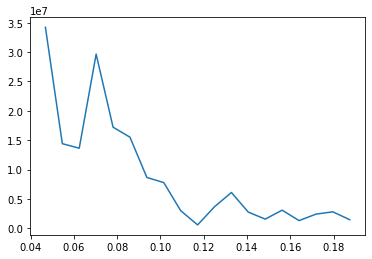

In [358]:
plt.plot(newbtcx_s, newbtcy_s)

## Ventana de tiempo ideal para BTC

In [359]:
1/0.070312

14.222323358743884

## Topological embedding

In [360]:
btc_tset = []
for tao in (range(int(btc.shape[0]/14)//1)):
    a = btc[(14*tao)]
    btc_tset.append(a)
btc_tset

[457.3340148925781,
 383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046

In [361]:
btc_embedding = []
for i in range(len(btc_tset)-1):
    point = (btc_tset[i], btc_tset[i+1])
    btc_embedding.append(point)
btc_embedding    

[(457.3340148925781, 383.614990234375),
 (383.614990234375, 394.77301025390625),
 (394.77301025390625, 335.59100341796875),
 (335.59100341796875, 423.5610046386719),
 (423.5610046386719, 368.3699951171875),
 (368.3699951171875, 346.364990234375),
 (346.364990234375, 322.53399658203125),
 (322.53399658203125, 294.3370056152344),
 (294.3370056152344, 226.89700317382812),
 (226.89700317382812, 226.85299682617188),
 (226.85299682617188, 236.3260040283203),
 (236.3260040283203, 273.0920104980469),
 (273.0920104980469, 256.29901123046875),
 (256.29901123046875, 247.27200317382812),
 (247.27200317382812, 223.83299255371094),
 (223.83299255371094, 225.80799865722656),
 (225.80799865722656, 236.3769989013672),
 (236.3769989013672, 237.2830047607422),
 (237.2830047607422, 228.80299377441406),
 (228.80299377441406, 240.51499938964844),
 (240.51499938964844, 270.7850036621094),
 (270.7850036621094, 277.22198486328125),
 (277.22198486328125, 281.8819885253906),
 (281.8819885253906, 226.684005737304

In [362]:
Xbtc = []
for i in range(len(btc_embedding)):
    x_bcte = btc_embedding[i][0]
    Xbtc.append(x_bcte)
Xbtc  

[457.3340148925781,
 383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046

In [363]:
Ybtc = []
for i in range(len(btc_embedding)):
    y_bcte = btc_embedding[i][1]
    Ybtc.append(y_bcte)
Ybtc 

[383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046875,
 573.2160034179

In [364]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xbtc))
px.scatter(x = Xbtc,y = Ybtc)

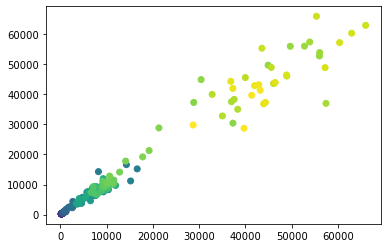

In [365]:
color = np.linspace(0,1, num=len(Xbtc))
plt.scatter(x = Xbtc,y = Ybtc, c = color)
plt.show()

## EUR/USD

In [366]:
eurusd = yf.download('EURUSD=X')['Adj Close']
eurusd

[*********************100%***********************]  1 of 1 completed


Date
2003-12-01    1.196501
2003-12-02    1.208897
2003-12-03    1.212298
2003-12-04    1.208094
2003-12-05    1.218695
                ...   
2022-06-17    1.054685
2022-06-20    1.049142
2022-06-21    1.052078
2022-06-22    1.053264
2022-06-23    1.056412
Name: Adj Close, Length: 4815, dtype: float64

(array([1.35471862e+02, 6.87974105e+01, 3.18151436e-02, 8.92250127e-03,
        5.57713337e-03, 2.54220070e-03, 2.64857300e-03, 1.54589294e-03,
        1.65687953e-03, 1.11891535e-03, 9.93559552e-04, 7.59892132e-04,
        6.29536207e-04, 4.81135423e-04, 5.75441138e-04, 3.95389693e-04,
        2.18358207e-04, 2.21465650e-04, 2.50967831e-04, 1.91190773e-04,
        2.18500143e-04, 2.53507082e-04, 2.34231980e-04, 1.79618076e-04,
        1.38474865e-04, 1.12606754e-04, 8.63550845e-05, 1.22487634e-04,
        1.44267789e-04, 1.15542576e-04, 1.14662101e-04, 1.17797832e-04,
        1.14509358e-04, 8.47782880e-05, 7.82879136e-05, 6.97864071e-05,
        1.20159267e-04, 9.84400806e-05, 7.55634687e-05, 7.54127618e-05,
        7.63360458e-05, 6.64308671e-05, 5.34575435e-05, 7.94398217e-05,
        5.27187959e-05, 5.60959899e-05, 5.37092960e-05, 4.55157823e-05,
        3.79823674e-05, 2.43203744e-05, 3.32321133e-05, 3.36391159e-05,
        4.39559913e-05, 5.13172468e-05, 4.64230724e-05, 5.952769

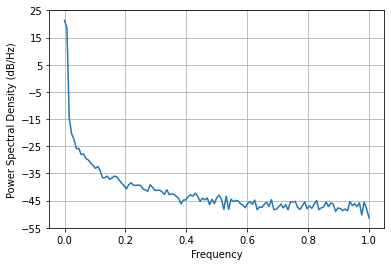

In [367]:
 plt.psd(eurusd)

In [368]:
eurusd_tset = []
for tao in (range(int(eurusd.shape[0]))):
    a = eurusd[(tao)]
    eurusd_tset.append(a)
eurusd_tset

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [369]:
eurusd_embedding = []
for i in range(len(eurusd_tset)-1):
    point = (eurusd_tset[i], eurusd_tset[i+1])
    eurusd_embedding.append(point)
eurusd_embedding 

[(1.19650137424469, 1.2088974714279175),
 (1.2088974714279175, 1.2122975587844849),
 (1.2122975587844849, 1.2080942392349243),
 (1.2080942392349243, 1.2186946868896484),
 (1.2186946868896484, 1.2220009565353394),
 (1.2220009565353394, 1.2249947786331177),
 (1.2249947786331177, 1.2190959453582764),
 (1.2190959453582764, 1.2224042415618896),
 (1.2224042415618896, 1.2278977632522583),
 (1.2278977632522583, 1.2319974899291992),
 (1.2319974899291992, 1.2321947813034058),
 (1.2321947813034058, 1.2402024269104004),
 (1.2402024269104004, 1.2422977685928345),
 (1.2422977685928345, 1.2384973764419556),
 (1.2384973764419556, 1.2398948669433594),
 (1.2398948669433594, 1.2400025129318237),
 (1.2400025129318237, 1.245298981666565),
 (1.245298981666565, 1.2448029518127441),
 (1.2448029518127441, 1.243193507194519),
 (1.243193507194519, 1.2483927011489868),
 (1.2483927011489868, 1.2548940181732178),
 (1.2548940181732178, 1.2590018510818481),
 (1.2590018510818481, 1.2581939697265625),
 (1.2581939697265

In [370]:
Xeurusd = []
for i in range(len(eurusd_embedding)):
    x_eute = eurusd_embedding[i][0]
    Xeurusd.append(x_eute)
Xeurusd  

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [371]:
Yeurusd = []
for i in range(len(eurusd_embedding)):
    y_eute = eurusd_embedding[i][1]
    Yeurusd.append(y_eute)
Yeurusd  

[1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,
 1.2571974992752075

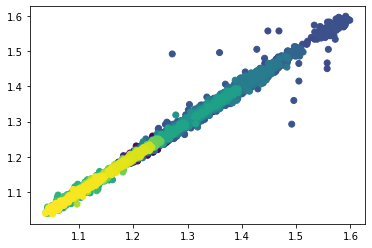

In [372]:
color = np.linspace(0,1, num=len(Xeurusd))
plt.scatter(x = Xeurusd,y = Yeurusd, c = color)
plt.show()

## Topological embedding 3d

In [373]:
eurusd

Date
2003-12-01    1.196501
2003-12-02    1.208897
2003-12-03    1.212298
2003-12-04    1.208094
2003-12-05    1.218695
                ...   
2022-06-17    1.054685
2022-06-20    1.049142
2022-06-21    1.052078
2022-06-22    1.053264
2022-06-23    1.056412
Name: Adj Close, Length: 4815, dtype: float64

In [374]:
eurusd3d_tset = []
for tao in (range(int(eurusd.shape[0]))):
    a = eurusd[(tao)]
    eurusd3d_tset.append(a)
eurusd3d_tset

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [375]:
eurusd3d_embedding = []
for i in range(len(eurusd3d_tset)-1):
    point = (eurusd3d_tset[i], eurusd3d_tset[i+1], i)
    eurusd3d_embedding.append(point)
eurusd3d_embedding 

[(1.19650137424469, 1.2088974714279175, 0),
 (1.2088974714279175, 1.2122975587844849, 1),
 (1.2122975587844849, 1.2080942392349243, 2),
 (1.2080942392349243, 1.2186946868896484, 3),
 (1.2186946868896484, 1.2220009565353394, 4),
 (1.2220009565353394, 1.2249947786331177, 5),
 (1.2249947786331177, 1.2190959453582764, 6),
 (1.2190959453582764, 1.2224042415618896, 7),
 (1.2224042415618896, 1.2278977632522583, 8),
 (1.2278977632522583, 1.2319974899291992, 9),
 (1.2319974899291992, 1.2321947813034058, 10),
 (1.2321947813034058, 1.2402024269104004, 11),
 (1.2402024269104004, 1.2422977685928345, 12),
 (1.2422977685928345, 1.2384973764419556, 13),
 (1.2384973764419556, 1.2398948669433594, 14),
 (1.2398948669433594, 1.2400025129318237, 15),
 (1.2400025129318237, 1.245298981666565, 16),
 (1.245298981666565, 1.2448029518127441, 17),
 (1.2448029518127441, 1.243193507194519, 18),
 (1.243193507194519, 1.2483927011489868, 19),
 (1.2483927011489868, 1.2548940181732178, 20),
 (1.2548940181732178, 1.25900

In [376]:
Xeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    x_eute = eurusd3d_embedding[i][0]
    Xeurusd3d.append(x_eute)
Xeurusd3d    

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [377]:
Yeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    y_eute = eurusd3d_embedding[i][1]
    Yeurusd3d.append(y_eute)
Yeurusd3d    

[1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,
 1.2571974992752075

In [378]:
Zeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    z_eute = eurusd3d_embedding[i][2]
    Zeurusd3d.append(z_eute)
Zeurusd3d    

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [379]:
pdforex = pd.DataFrame()
pdforex['x'] = Xeurusd3d
pdforex['y'] = Yeurusd3d
pdforex['z'] = Zeurusd3d
pdforex

,x,y,z
0,1.196501,1.208897,0
1,1.208897,1.212298,1
2,1.212298,1.208094,2
3,1.208094,1.218695,3
4,1.218695,1.222001,4
...,...,...,...
4809,1.045620,1.054685,4809
4810,1.054685,1.049142,4810
4811,1.049142,1.052078,4811
4812,1.052078,1.053264,4812


In [380]:
fig = px.scatter_3d(pdforex, x='x', y='y', z='z', color = pdforex['z'])
fig.show()

## Luna

In [381]:
luna = yf.download('LUNA1-USD')['Adj Close']
luna

[*********************100%***********************]  1 of 1 completed


Date
2019-07-26    1.327436
2019-07-27    1.310566
2019-07-28    1.272989
2019-07-29    1.294661
2019-07-30    1.294193
                ...   
2022-06-19    0.000061
2022-06-20    0.000058
2022-06-21    0.000058
2022-06-22    0.000057
2022-06-23    0.000057
Name: Adj Close, Length: 1064, dtype: float64

(array([9.77686099e+04, 5.55754564e+04, 1.87715928e+03, 3.22680141e+03,
        1.17578391e+03, 1.55526553e+02, 6.73927353e+01, 6.15986238e+01,
        3.59913756e+01, 4.43609598e+01, 1.83525840e+02, 4.79471447e+02,
        3.48185173e+02, 1.23501235e+02, 4.40150997e+00, 3.41389913e+01,
        1.08394620e+01, 3.35295081e+01, 4.86057211e+01, 3.09523336e+01,
        1.01306333e+01, 7.27818157e+00, 3.32356002e+01, 5.96857153e+01,
        3.82222189e+01, 7.99614802e+00, 2.80823341e+00, 3.52552397e+00,
        5.99962909e+00, 4.37518524e+00, 1.42059816e+01, 1.76701969e+01,
        3.26265201e+00, 8.48165330e+00, 8.82798408e+00, 1.43014288e+01,
        1.11502765e+01, 1.80708569e+00, 1.77330034e+00, 1.14725815e+00,
        1.22782594e+00, 4.90921283e+00, 9.82049535e+00, 4.14088418e+00,
        1.18553572e+00, 1.08280795e+00, 3.74754105e-01, 6.01328029e-01,
        1.65191311e+00, 4.84284210e+00, 1.91470740e+00, 3.75571445e+00,
        3.22741122e+00, 3.61514111e+00, 1.99276180e-01, 1.712807

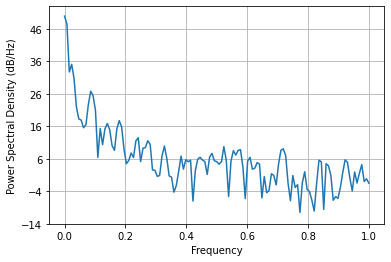

In [382]:
 plt.psd(luna)

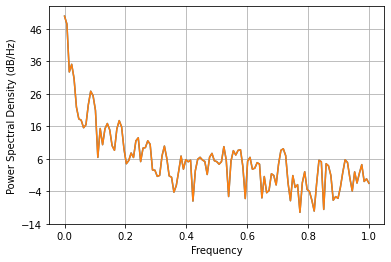

In [383]:
lunax_s = plt.psd(luna)[1]
lunay_s = plt.psd(luna)[0]

In [384]:
lunamatrix = []
for _ in range(lunax_s.shape[0]):
    c = (lunax_s[_], lunay_s[_])
    lunamatrix.append(c)
pd.DataFrame(lunamatrix).head(20)  

,0,1
0,0.000000,97768.609852
1,0.007812,55575.456449
2,0.015625,1877.159282
3,0.023438,3226.801409
4,0.031250,1175.783915
5,0.039062,155.526553
6,0.046875,67.392735
7,0.054688,61.598624
8,0.062500,35.991376
9,0.070312,44.360960


C:\Users\FELIZA~1\AppData\Local\Temp/ipykernel_2564/3193297472.py:3: RuntimeWarning:

divide by zero encountered in log



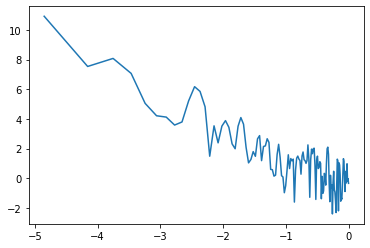

In [385]:
#newlunay_s = lunay_s[(0<lunax_s)&(lunax_s<0.3)]
#newlunax_s = lunax_s[(0<lunax_s)&(lunax_s<0.3)]
plt.plot(np.log(lunax_s), np.log(lunay_s))

In [386]:
np.e**-2.5

0.0820849986238988

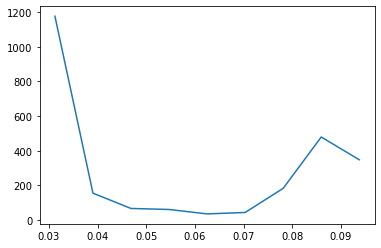

In [387]:
newlunay_s = lunay_s[(0.03<lunax_s)&(lunax_s<0.1)]
newlunax_s = lunax_s[(0.03<lunax_s)&(lunax_s<0.1)]
plt.plot(newlunax_s, newlunay_s)

## Ventana de tiempo adecuada para LUNA

In [388]:
1/0.085938

11.6362959342782

Utilizaremos el historico con lag time = 1 para tener una cantidad de datos considerables para el análisis

In [389]:
luna

Date
2019-07-26    1.327436
2019-07-27    1.310566
2019-07-28    1.272989
2019-07-29    1.294661
2019-07-30    1.294193
                ...   
2022-06-19    0.000061
2022-06-20    0.000058
2022-06-21    0.000058
2022-06-22    0.000057
2022-06-23    0.000057
Name: Adj Close, Length: 1064, dtype: float64

In [390]:
luna_tset = []
for tao in (range(int(luna.shape[0]/1)//1)):
    a = luna[1*(tao)]
    luna_tset.append(a)
luna_tset

[1.3274359703063965,
 1.3105659484863281,
 1.27298903465271,
 1.294661045074463,
 1.2941930294036865,
 1.3001019954681396,
 1.2779840230941772,
 1.267514944076538,
 1.2605979442596436,
 1.2461719512939453,
 1.189715027809143,
 1.1510449647903442,
 1.1137770414352417,
 1.2010730504989624,
 1.2183849811553955,
 1.1351209878921509,
 1.2741260528564453,
 1.283668041229248,
 1.3866300582885742,
 1.304455041885376,
 1.320667028427124,
 1.2953519821166992,
 1.3170280456542969,
 1.3030999898910522,
 1.3132940530776978,
 1.2600430250167847,
 1.2958500385284424,
 1.2221570014953613,
 1.183877944946289,
 1.1696289777755737,
 1.236132025718689,
 1.1734369993209839,
 1.1586799621582031,
 1.120514988899231,
 1.1471489667892456,
 1.168323040008545,
 1.1742939949035645,
 1.1591689586639404,
 1.1568880081176758,
 1.23259699344635,
 1.1779570579528809,
 1.1608010530471802,
 1.1331959962844849,
 1.1638009548187256,
 1.1543550491333008,
 1.1143510341644287,
 1.0915939807891846,
 1.0637669563293457,
 1.064

In [391]:
luna_embedding = []
for i in range(len(luna_tset)-1):
    point = (luna_tset[i], luna_tset[i+1])
    luna_embedding.append(point)
luna_embedding   

[(1.3274359703063965, 1.3105659484863281),
 (1.3105659484863281, 1.27298903465271),
 (1.27298903465271, 1.294661045074463),
 (1.294661045074463, 1.2941930294036865),
 (1.2941930294036865, 1.3001019954681396),
 (1.3001019954681396, 1.2779840230941772),
 (1.2779840230941772, 1.267514944076538),
 (1.267514944076538, 1.2605979442596436),
 (1.2605979442596436, 1.2461719512939453),
 (1.2461719512939453, 1.189715027809143),
 (1.189715027809143, 1.1510449647903442),
 (1.1510449647903442, 1.1137770414352417),
 (1.1137770414352417, 1.2010730504989624),
 (1.2010730504989624, 1.2183849811553955),
 (1.2183849811553955, 1.1351209878921509),
 (1.1351209878921509, 1.2741260528564453),
 (1.2741260528564453, 1.283668041229248),
 (1.283668041229248, 1.3866300582885742),
 (1.3866300582885742, 1.304455041885376),
 (1.304455041885376, 1.320667028427124),
 (1.320667028427124, 1.2953519821166992),
 (1.2953519821166992, 1.3170280456542969),
 (1.3170280456542969, 1.3030999898910522),
 (1.3030999898910522, 1.313

In [392]:
Xluna = []
for i in range(len(luna_embedding)):
    x_lte = luna_embedding[i][0]
    Xluna.append(x_lte)
Xluna 

[1.3274359703063965,
 1.3105659484863281,
 1.27298903465271,
 1.294661045074463,
 1.2941930294036865,
 1.3001019954681396,
 1.2779840230941772,
 1.267514944076538,
 1.2605979442596436,
 1.2461719512939453,
 1.189715027809143,
 1.1510449647903442,
 1.1137770414352417,
 1.2010730504989624,
 1.2183849811553955,
 1.1351209878921509,
 1.2741260528564453,
 1.283668041229248,
 1.3866300582885742,
 1.304455041885376,
 1.320667028427124,
 1.2953519821166992,
 1.3170280456542969,
 1.3030999898910522,
 1.3132940530776978,
 1.2600430250167847,
 1.2958500385284424,
 1.2221570014953613,
 1.183877944946289,
 1.1696289777755737,
 1.236132025718689,
 1.1734369993209839,
 1.1586799621582031,
 1.120514988899231,
 1.1471489667892456,
 1.168323040008545,
 1.1742939949035645,
 1.1591689586639404,
 1.1568880081176758,
 1.23259699344635,
 1.1779570579528809,
 1.1608010530471802,
 1.1331959962844849,
 1.1638009548187256,
 1.1543550491333008,
 1.1143510341644287,
 1.0915939807891846,
 1.0637669563293457,
 1.064

In [393]:
Yluna = []
for i in range(len(luna_embedding)):
    y_lte = luna_embedding[i][1]
    Yluna.append(y_lte)
Yluna

[1.3105659484863281,
 1.27298903465271,
 1.294661045074463,
 1.2941930294036865,
 1.3001019954681396,
 1.2779840230941772,
 1.267514944076538,
 1.2605979442596436,
 1.2461719512939453,
 1.189715027809143,
 1.1510449647903442,
 1.1137770414352417,
 1.2010730504989624,
 1.2183849811553955,
 1.1351209878921509,
 1.2741260528564453,
 1.283668041229248,
 1.3866300582885742,
 1.304455041885376,
 1.320667028427124,
 1.2953519821166992,
 1.3170280456542969,
 1.3030999898910522,
 1.3132940530776978,
 1.2600430250167847,
 1.2958500385284424,
 1.2221570014953613,
 1.183877944946289,
 1.1696289777755737,
 1.236132025718689,
 1.1734369993209839,
 1.1586799621582031,
 1.120514988899231,
 1.1471489667892456,
 1.168323040008545,
 1.1742939949035645,
 1.1591689586639404,
 1.1568880081176758,
 1.23259699344635,
 1.1779570579528809,
 1.1608010530471802,
 1.1331959962844849,
 1.1638009548187256,
 1.1543550491333008,
 1.1143510341644287,
 1.0915939807891846,
 1.0637669563293457,
 1.0648880004882812,
 1.057

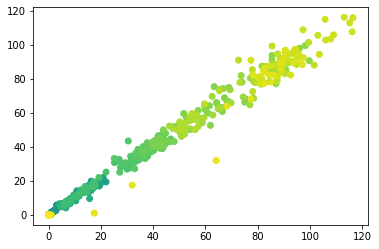

In [394]:
color = np.linspace(0,1, num=len(Xluna))
plt.scatter(x = Xluna,y = Yluna, c = color)
plt.show()

## Hausdorff distance

In [395]:
directed_hausdorff(np.array(btc_embedding), np.array(luna_embedding))

(91051.1976907788, 185, 983)

In [396]:
directed_hausdorff(np.array(aapl_embedding), np.array(tgt_embedding))

(11.128307465714368, 2531, 1995)

In [512]:
tickers = [aapl_embedding, aapl16_embedding, tgt_embedding, tgt4_embedding, baba_embedding, luna_embedding, btc_embedding, eurusd_embedding]# qcom_embedding, qcom4_embedding, atvi_embedding, TSLA.ticker_embedding, AMD.ticker_embedding]

In [513]:
#tickers = [AAPL, AAPL16, TGT, TGT4, BABA, LUNA, BTC, EUR/USD]#, QCOM, QCOM4, ATVI, TSLA, AMD]
str_tickers = ['AAPL', 'AAPL16', 'TGT', 'TGT4', 'BABA', 'LUNA', 'BTC', 'EUR/USD']#, 'QCOM', 'QCOM4', 'ATVI', 'TSLA', 'AMD']

In [514]:
aaple_hausdorff = pd.DataFrame()
aaple_hausdorff.index = str_tickers

measures = []
for i in tickers:
        a = directed_hausdorff(np.array(aapl_embedding), np.array(i))[0]
        measures.append(a)
aaple_hausdorff['Distances'] = measures
aaple_hausdorff

,Distances
AAPL,0.000000
AAPL16,10.779717
TGT,11.128307
TGT4,10.372223
BABA,87.776900
LUNA,90.385232
BTC,317.889675
EUR/USD,252.529828


## TE y Hausdorff para distintos tickers

### AAPL

In [515]:
AAPL = Tembedding('AAPL', '2018-01-01', '2022-06-02')
AAPL.tset('AAPL', 1)
AAPL.tembedding()
AAPL.ticker_embedding
AAPL.metric(tickers, str_tickers)
AAPL.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,4.761505
AAPL16,10.248568
TGT,11.355050
TGT4,10.272957
BABA,38.364938
LUNA,90.660448
BTC,268.236528
EUR/USD,252.816995


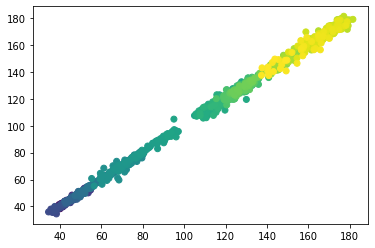

In [516]:
AAPL.graph(AAPL.ticker_embedding)

In [517]:
AAPL.ticker_tset
AAPL.tembedding3d(AAPL.ticker_tset)
AAPL.ticker_embedding3d
AAPL.graph3d(AAPL.ticker_embedding3d)

## AAPL16

In [519]:
AAPL16 = Tembedding('AAPL', '2018-01-01', '2022-06-02')
AAPL16.tset('AAPL', 16)
AAPL16.tembedding()
AAPL16.ticker_embedding
AAPL16.metric(tickers, str_tickers)
AAPL16.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,9.171533
AAPL16,0.000022
TGT,11.262959
TGT4,12.630308
BABA,33.591184
LUNA,87.196022
BTC,263.409129
EUR/USD,249.242392


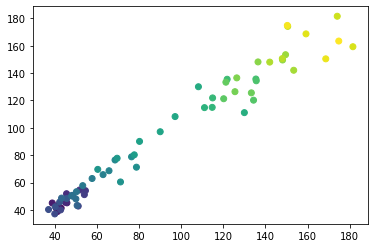

In [520]:
AAPL16.graph(AAPL16.ticker_embedding)

In [521]:
AAPL16.ticker_tset
AAPL16.tembedding3d(AAPL16.ticker_tset)
AAPL16.ticker_embedding3d
AAPL16.graph3d(AAPL16.ticker_embedding3d)

## TGT

In [522]:
TGT = Tembedding('TGT', '2018-01-01', '2022-06-02')
TGT.tset('TGT', 1)
TGT.tembedding()
TGT.ticker_embedding
TGT.metric(tickers, str_tickers)
TGT.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,116.713359
AAPL16,120.090763
TGT,9.006658
TGT4,7.081554
BABA,21.603895
LUNA,207.086053
BTC,237.342347
EUR/USD,369.241639


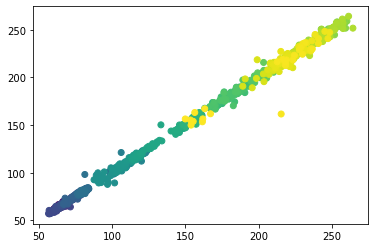

In [523]:
TGT.graph(TGT.ticker_embedding)

In [525]:
TGT.ticker_tset
TGT.tembedding3d(TGT.ticker_tset)
TGT.ticker_embedding3d
TGT.graph3d(TGT.ticker_embedding3d)

## TGT4

In [526]:
TGT4 = Tembedding('TGT', '2018-01-01', '2022-06-02')
TGT4.tset('TGT', 4)
TGT4.tembedding()
TGT4.ticker_embedding
TGT4.metric(tickers, str_tickers)
TGT4.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,110.417595
AAPL16,113.825206
TGT,8.165367
TGT4,8.224941
BABA,28.564403
LUNA,200.779326
BTC,234.889694
EUR/USD,362.939019


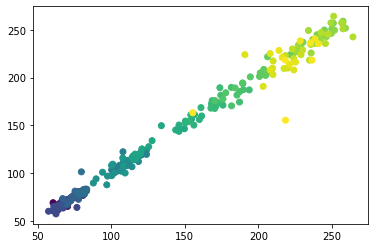

In [527]:
TGT4.graph(TGT4.ticker_embedding)

In [529]:
TGT4.ticker_tset
TGT4.tembedding3d(TGT4.ticker_tset)
TGT4.ticker_embedding3d
TGT4.graph3d(TGT4.ticker_embedding3d)

## BABA

In [530]:
BABA = Tembedding('BABA', '2018-01-01', '2022-06-02')
BABA.tset('BABA', 1)
BABA.tembedding()
BABA.ticker_embedding
BABA.metric(tickers, str_tickers)
BABA.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,187.409471
AAPL16,190.917992
TGT,78.108658
TGT4,76.954091
BABA,16.135523
LUNA,277.651673
BTC,208.692654
EUR/USD,439.790852


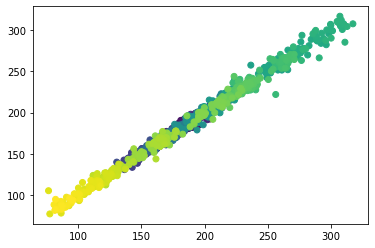

In [531]:
BABA.graph(BABA.ticker_embedding)

In [533]:
BABA.ticker_tset
BABA.tembedding3d(BABA.ticker_tset)
BABA.ticker_embedding3d
BABA.graph3d(BABA.ticker_embedding3d)

## LUNA

In [534]:
LUNA = Tembedding('LUNA', '2018-01-01', '2022-06-02')
LUNA.tset('LUNA', 1)
LUNA.tembedding()
LUNA.ticker_embedding
LUNA.metric(tickers, str_tickers)
LUNA.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,0.986686
AAPL16,1.081371
TGT,0.967422
TGT4,0.894728
BABA,84.901464
LUNA,1.349601
BTC,315.012955
EUR/USD,15.691297


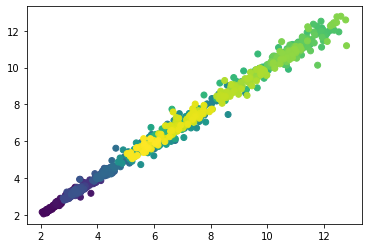

In [535]:
LUNA.graph(LUNA.ticker_embedding)

In [537]:
LUNA.ticker_tset
LUNA.tembedding3d(LUNA.ticker_tset)
LUNA.ticker_embedding3d
LUNA.graph3d(LUNA.ticker_embedding3d)

## BTC

In [538]:
BTC = Tembedding('BTC', '2018-01-01', '2022-06-02')
BTC.tset('BTC', 1)
BTC.tembedding()
BTC.ticker_embedding
BTC.metric(tickers, str_tickers)
BTC.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,5.226646
AAPL16,9.418005
TGT,5.369710
TGT4,5.049665
BABA,3.473379
LUNA,2.080102
BTC,186.604920
EUR/USD,139.362202


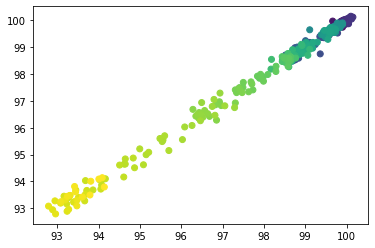

In [539]:
BTC.graph(BTC.ticker_embedding)

In [542]:
BTC.ticker_tset
BTC.tembedding3d(BTC.ticker_tset)
BTC.ticker_embedding3d
BTC.graph3d(BTC.ticker_embedding3d)

## EUR/USD

In [543]:
EURUSD = Tembedding('EURUSD=X', '2018-01-01', '2022-06-02')
EURUSD.tset('EURUSD=X', 1)
EURUSD.tembedding()
EURUSD.ticker_embedding
EURUSD.metric(tickers, str_tickers)
EURUSD.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,0.032505
AAPL16,0.100235
TGT,0.039138
TGT4,0.043810
BABA,86.366714
LUNA,0.033314
BTC,316.477886
EUR/USD,0.000000


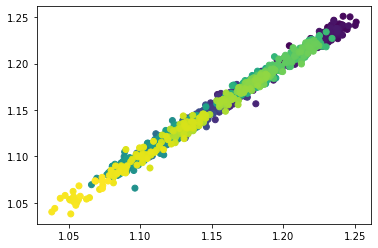

In [544]:
EURUSD.graph(EURUSD.ticker_embedding)

In [546]:
EURUSD.ticker_tset
EURUSD.tembedding3d(EURUSD.ticker_tset)
EURUSD.ticker_embedding3d
EURUSD.graph3d(EURUSD.ticker_embedding3d)

### QCOM

In [547]:
QCOM = Tembedding('QCOM','2018-01-01', '2022-06-02')
QCOM.tset('QCOM', 1)
QCOM.tembedding()
QCOM.ticker_embedding
QCOM.metric(tickers, str_tickers)
QCOM.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,8.461854
AAPL16,14.336205
TGT,13.584602
TGT4,11.283800
BABA,25.485834
LUNA,97.373484
BTC,255.397528
EUR/USD,259.535913


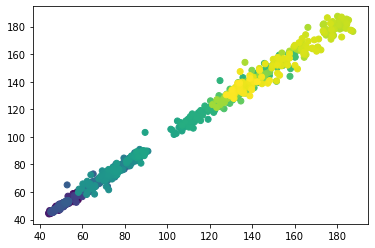

In [548]:
QCOM.graph(QCOM.ticker_embedding)

In [549]:
QCOM.ticker_tset
QCOM.tembedding3d(QCOM.ticker_tset)
QCOM.ticker_embedding3d
QCOM.graph3d(QCOM.ticker_embedding3d)

## QCOM4

In [550]:
QCOM4 = Tembedding('QCOM', '2018-01-01', '2022-06-02')
QCOM4.tset('QCOM', 4)
QCOM4.tembedding()
QCOM4.ticker_embedding
QCOM4.metric(tickers, str_tickers)
QCOM4.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,12.869214
AAPL16,13.902508
TGT,12.925962
TGT4,12.246613
BABA,24.358262
LUNA,95.975968
BTC,254.314605
EUR/USD,258.048100


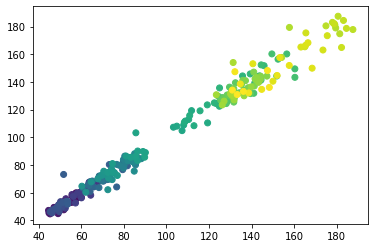

In [551]:
QCOM4.graph(QCOM4.ticker_embedding)

In [553]:
QCOM4.ticker_tset
QCOM4.tembedding3d(QCOM4.ticker_tset)
QCOM4.ticker_embedding3d
QCOM4.graph3d(QCOM4.ticker_embedding3d)

## ATVI

In [554]:
ATVI = Tembedding('ATVI', '2018-01-01', '2022-06-02')
ATVI.tset('ATVI', 1)
ATVI.tembedding()
ATVI.ticker_embedding
ATVI.metric(tickers, str_tickers)
ATVI.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,9.205541
AAPL16,11.389029
TGT,7.229229
TGT4,5.953216
BABA,31.765845
LUNA,6.485474
BTC,261.562600
EUR/USD,142.584924


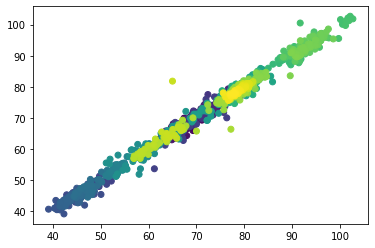

In [555]:
ATVI.graph(ATVI.ticker_embedding)

In [556]:
ATVI.ticker_tset
ATVI.tembedding3d(ATVI.ticker_tset)
ATVI.ticker_embedding3d
ATVI.graph3d(ATVI.ticker_embedding3d)

## TSLA

In [557]:
TSLA = Tembedding('TSLA', '2018-01-01', '2022-06-02')
TSLA.tset('TSLA', 1)
TSLA.tembedding()
TSLA.ticker_embedding
TSLA.metric(tickers, str_tickers)
TSLA.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,1479.066332
AAPL16,1482.422251
TGT,1369.668137
TGT4,1368.505359
BABA,1304.004264
LUNA,1569.416799
BTC,266.458121
EUR/USD,1731.579011


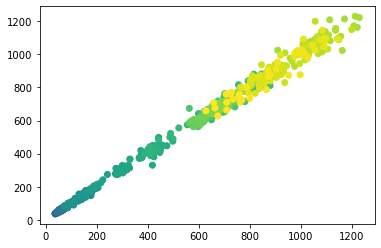

In [558]:
TSLA.graph(TSLA.ticker_embedding)

In [559]:
TSLA.ticker_tset
TSLA.tembedding3d(TSLA.ticker_tset)
TSLA.ticker_embedding3d
TSLA.graph3d(TSLA.ticker_embedding3d)

## AMD

In [560]:
AMD = Tembedding('AMD', '2018-01-01', '2022-06-02')
AMD.tset('AMD', 1)
AMD.tembedding()
AMD.ticker_embedding
AMD.metric(tickers, str_tickers)
AMD.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,8.754619
AAPL16,12.893634
TGT,12.240515
TGT4,11.152348
BABA,74.359925
LUNA,62.096505
BTC,304.455735
EUR/USD,224.230529


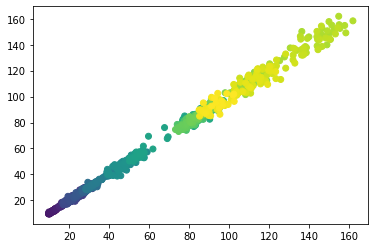

In [561]:
AMD.graph(AMD.ticker_embedding)

In [562]:
AMD.ticker_tset
AMD.tembedding3d(AMD.ticker_tset)
AMD.ticker_embedding3d
AMD.graph3d(AMD.ticker_embedding3d)

## ADBE

In [563]:
ADBE = Tembedding('ADBE', '2018-01-01', '2022-06-02')
ADBE.tset('ADBE', 1)
ADBE.tembedding()
ADBE.ticker_embedding
ADBE.metric(tickers, str_tickers)
ADBE.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,708.367011
AAPL16,711.767803
TGT,598.960905
TGT4,597.798961
BABA,533.379244
LUNA,798.684818
BTC,84.558323
EUR/USD,960.838401


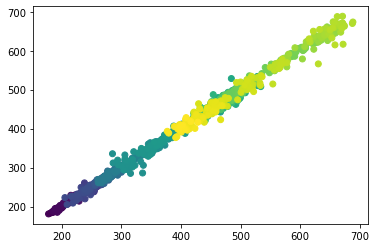

In [564]:
ADBE.graph(ADBE.ticker_embedding)

In [565]:
ADBE.ticker_tset
ADBE.tembedding3d(ADBE.ticker_tset)
ADBE.ticker_embedding3d
ADBE.graph3d(ADBE.ticker_embedding3d)

## ALGN

In [566]:
ALGN = Tembedding('ALGN', '2018-01-01', '2022-06-02')
ALGN.tset('ALGN', 1)
ALGN.tembedding()
ALGN.ticker_embedding
ALGN.metric(tickers, str_tickers)
ALGN.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,775.015031
AAPL16,778.376431
TGT,665.616536
TGT4,664.453747
BABA,599.959853
LUNA,865.365725
BTC,118.332359
EUR/USD,1027.528135


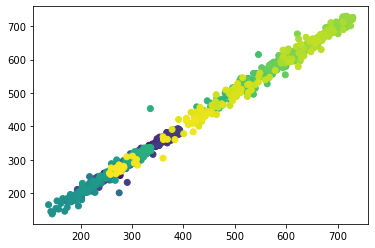

In [567]:
ALGN.graph(ALGN.ticker_embedding)

In [568]:
ALGN.ticker_tset
ALGN.tembedding3d(ALGN.ticker_tset)
ALGN.ticker_embedding3d
ALGN.graph3d(ALGN.ticker_embedding3d)

##  GOOG

In [570]:
GOOG = Tembedding('GOOG', '2018-01-01', '2022-06-02')
GOOG.tset('GOOG', 1)
GOOG.tembedding()
GOOG.ticker_embedding
GOOG.metric(tickers, str_tickers)
GOOG.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,3997.237360
AAPL16,4000.584705
TGT,3887.841436
TGT4,3886.678587
BABA,3822.167145
LUNA,4087.591108
BTC,626.509019
EUR/USD,4249.753513


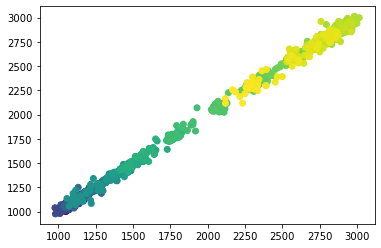

In [571]:
GOOG.graph(GOOG.ticker_embedding)

In [572]:
GOOG.ticker_tset
GOOG.tembedding3d(GOOG.ticker_tset)
GOOG.ticker_embedding3d
GOOG.graph3d(GOOG.ticker_embedding3d)

## GOOGL

In [573]:
GOOGL = Tembedding('GOOGL', '2018-01-01', '2022-06-02')
GOOGL.tset('GOOGL', 1)
GOOGL.tembedding()
GOOGL.ticker_embedding
GOOGL.metric(tickers, str_tickers)
GOOGL.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,3970.424580
AAPL16,3973.773844
TGT,3861.027803
TGT4,3859.864986
BABA,3795.356061
LUNA,4060.776961
BTC,627.676559
EUR/USD,4222.939234


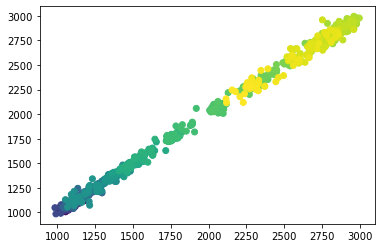

In [574]:
GOOGL.graph(GOOGL.ticker_embedding)

In [575]:
GOOGL.ticker_tset
GOOGL.tembedding3d(GOOGL.ticker_tset)
GOOGL.ticker_embedding3d
GOOGL.graph3d(GOOGL.ticker_embedding3d)

## AMZN

In [576]:
AMZN = Tembedding('AMZN', '2018-01-01', '2022-06-02')
AMZN.tset('AMZN', 1)
AMZN.tembedding()
AMZN.ticker_embedding
AMZN.metric(tickers, str_tickers)
AMZN.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,9.121296
AAPL16,13.259316
TGT,19.530221
TGT4,18.055856
BABA,10.578224
LUNA,99.005978
BTC,233.333026
EUR/USD,261.168481


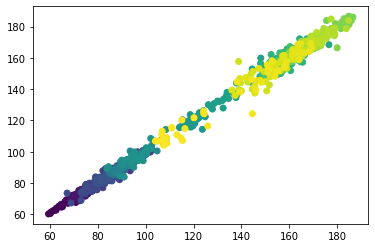

In [577]:
AMZN.graph(AMZN.ticker_embedding)

In [578]:
AMZN.ticker_tset
AMZN.tembedding3d(AMZN.ticker_tset)
AMZN.ticker_embedding3d
AMZN.graph3d(AMZN.ticker_embedding3d)

## AMGN

In [579]:
AMGN = Tembedding('AMGN', '2018-01-01', '2022-06-02')
AMGN.tset('AMGN', 1)
AMGN.tembedding()
AMGN.ticker_embedding
AMGN.metric(tickers, str_tickers)
AMGN.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,107.263955
AAPL16,110.675853
TGT,10.589977
TGT4,8.390214
BABA,11.030523
LUNA,197.624602
BTC,109.490977
EUR/USD,359.784505


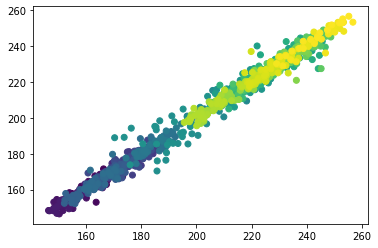

In [580]:
AMGN.graph(AMGN.ticker_embedding)

In [581]:
AMGN.ticker_tset
AMGN.tembedding3d(AMGN.ticker_tset)
AMGN.ticker_embedding3d
AMGN.graph3d(AMGN.ticker_embedding3d)

## ADI

In [582]:
ADI = Tembedding('ADI', '2018-01-01', '2022-06-02')
ADI.tset('ADI', 1)
ADI.tembedding()
ADI.ticker_embedding
ADI.metric(tickers, str_tickers)
ADI.ticker_hausdorff

[*********************100%***********************]  1 of 1 completed


,Distances
AAPL,11.541994
AAPL16,18.000963
TGT,11.543184
TGT4,11.766420
BABA,8.173289
LUNA,98.555439
BTC,214.727984
EUR/USD,260.715766


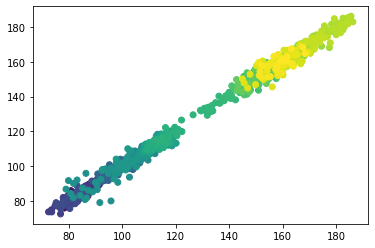

In [583]:
ADI.graph(ADI.ticker_embedding)

In [584]:
ADI.ticker_tset
ADI.tembedding3d(ADI.ticker_tset)
ADI.ticker_embedding3d
ADI.graph3d(ADI.ticker_embedding3d)

In [447]:
# tickers = [AAPL.ticker_embedding, AAPL16.ticker_embedding, TGT.ticker_embedding, TGT4.ticker_embedding, BABA.ticker_embedding, LUNA.ticker_embedding, BTC.ticker_embedding, EURUSD.ticker_embedding, QCOM.ticker_embedding, QCOM4.ticker_embedding, ATVI.ticker_embedding, TSLA.ticker_embedding, AMD.ticker_embedding, ADBE.ticker_embedding, ALGN.ticker_embedding, GOOG.ticker_embedding, GOOGL.ticker_embedding, AMZN.ticker_embedding, AMGN.ticker_embedding, ADI.ticker_embedding]
# str_tickers = ['AAPL', 'AAPL16', 'TGT', 'TGT4', 'BABA', 'LUNA', 'BTC', 'EUR/USD', 'QCOM', 'QCOM4', 'ATVI', 'TSLA', 'AMD', 'ADBE', 'ALGN', 'GOOG', 'GOOGL', 'AMZN', 'AMGN', 'ADI']

## Fourier transformation

In [244]:
aapl = np.array(df)
aapl

array([1.00178450e-01, 9.49520469e-02, 8.79827887e-02, ...,
       1.35869995e+02, 1.35350006e+02, 1.36779999e+02])

In [6]:
fft(aapl)


array([148053.05468387    +0.j        , 110699.83124654+61343.37841322j,
        63249.81931892+66192.36209933j, ...,
        45828.68823096-54619.37644465j,  63249.81931892-66192.36209933j,
       110699.83124654-61343.37841322j])

In [7]:
x = fft(aapl).real
x.max()

148053.05468387157

In [8]:
y = fft(aapl).imag
y

array([     0.        ,  61343.37841322,  66192.36209933, ...,
       -54619.37644465, -66192.36209933, -61343.37841322])

In [9]:
# x = [fft(aapl).real for _ in fft(aapl)]
# y = [fft(aapl).imag for _ in fft(aapl)]
# plt.scatter(x, y)
# plt.ylabel('Imaginary')
# plt.xlabel('Real')
# plt.show()

In [10]:
fft(df)

array([148053.05468387    +0.j        , 110699.83124654+61343.37841322j,
        63249.81931892+66192.36209933j, ...,
        45828.68823096-54619.37644465j,  63249.81931892-66192.36209933j,
       110699.83124654-61343.37841322j])

In [11]:
x_init = fft(df).real 

In [12]:
y_init = fft(df).imag

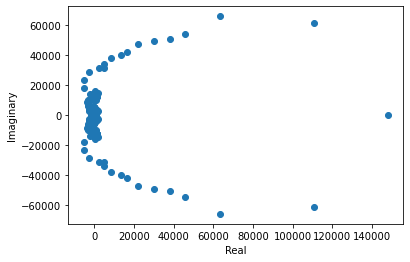

In [13]:
plt.scatter(x_init,y_init)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

In [14]:
y = y_init[(-4000<x_init)&(x_init<2500)]
x = x_init[(-4000<x_init)&(x_init<2500)]


In [15]:
x

array([ 2036.4660361 , -2685.48613773, -2129.08767052, ...,
       -2129.08767052, -2685.48613773,  2036.4660361 ])

In [16]:
x_init

array([148053.05468387, 110699.83124654,  63249.81931892, ...,
        45828.68823096,  63249.81931892, 110699.83124654])

In [17]:
y

array([ 31365.63649044,  28801.0875575 ,  13886.93952294, ...,
       -13886.93952294, -28801.0875575 , -31365.63649044])

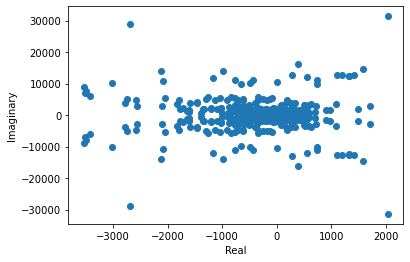

In [18]:
plt.scatter(x, y)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

In [19]:
range(x.shape[0])

range(0, 10442)

In [20]:
z = []
for _ in range(x.shape[0]):
    c = complex(x[_], y[_])
    z.append(c)
print(z)

[(2036.4660361033234+31365.63649043629j), (-2685.486137733451+28801.087557501793j), (-2129.0876705150417+13886.939522942306j), (1581.5783954273884+14583.86758074165j), (385.3455938963094+16093.818344225174j), (-994.024108724471+14054.37109427618j), (553.5266616357438+12182.134606209342j), (1412.7315929481078+12769.337461863402j), (1196.3842230601522+12570.28658854235j), (1318.4759918880684+12550.391704587371j), (1320.6120926389483+12357.61438912011j), (1110.4804987584325+12665.07856319016j), (272.6831244606809+12875.92565434303j), (-1177.0689751778389+11901.258676900623j), (-657.0846187060436+9968.906709721603j), (728.4902482057483+9972.871627100365j), (740.2701958114646+11106.41518052716j), (-441.9433494976096+11008.521718926244j), (-484.0110186255941+10121.555641042165j), (1.7056600752136077+10371.430857703293j), (-771.0407958125729+11131.72537395176j), (-2089.7754675505835+10809.42886622041j), (-3020.4488686373247+10082.574504821196j), (-3536.5098281815735+8805.61785134549j), (-3487

In [21]:
ifft(z)

array([-80.57825887+4.71844785e-14j, -78.73549434+2.36884560e-02j,
       -77.24599177+4.64806492e-02j, ...,  44.58580421+4.02424266e-02j,
        47.51223032+2.85891767e-02j,  53.17718258+1.59989515e-02j])

In [22]:
x_inv = ifft(z).real
y_inv = ifft(z).imag

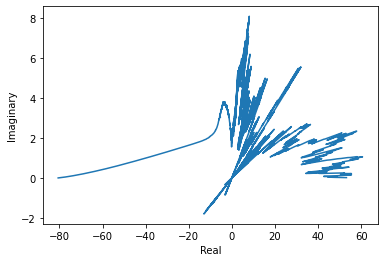

In [23]:
plt.plot(x_inv, y_inv)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

Text(0.5, 0, 'Tiempo')

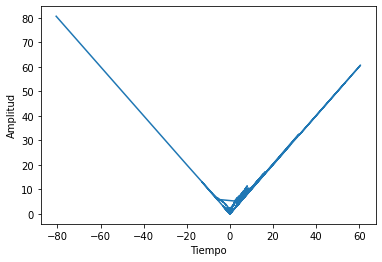

In [24]:
plt.plot(x_inv, np.absolute(ifft(z)))
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')

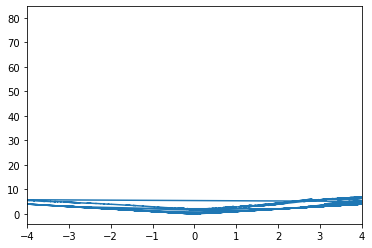

In [27]:
plt.plot(x_inv, np.absolute(ifft(z)))
plt.xlim([-4,4])
plt.show()
